# COSMOS master catalogue
## Checks and diagnostics

In [1]:
from herschelhelp_internal import git_version
print("This notebook was run with herschelhelp_internal version: \n{}".format(git_version()))

This notebook was run with herschelhelp_internal version: 
33f5ec7 (Wed Dec 6 16:56:17 2017 +0000)


In [2]:
%matplotlib inline
#%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
plt.rc('figure', figsize=(10, 6))
plt.style.use('ggplot')

import locale
locale.setlocale(locale.LC_ALL, 'en_GB')

import os
import time
import itertools

from astropy.coordinates import SkyCoord
from astropy.table import Table
from astropy import units as u
from astropy import visualization as vis
import numpy as np
from matplotlib_venn import venn3, venn2

from herschelhelp_internal.masterlist import nb_compare_mags, nb_ccplots, nb_histograms, quick_checks, find_last_ml_suffix

In [3]:
OUT_DIR = os.environ.get('OUT_DIR', "./data")
SUFFIX = find_last_ml_suffix()
#SUFFIX = "_20170815"

master_catalogue = Table.read("{}/master_catalogue_cosmos_{}.fits".format(OUT_DIR, SUFFIX))

## 0 - Quick checks

In [4]:
quick_checks(master_catalogue).show_in_notebook()

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/numpy/core/numeric.py:301: FutureWarning: in the future, full(268, False) will return an array of dtype('bool')
  format(shape, fill_value, array(fill_value).dtype), FutureWarning)
/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/numpy/core/numeric.py:301: FutureWarning: in the future, full(268, 0) will return an array of dtype('int64')
  format(shape, fill_value, array(fill_value).dtype), FutureWarning)


Table shows only problematic columns.


idx,Column,All nan,#Measurements,#Zeros,#Negative,Minimum value
0,ferr_ap_gpc1_g,False,124592,9,0,0.0
1,merr_ap_gpc1_g,False,124592,9,0,0.0
2,ferr_gpc1_g,False,124402,31,0,0.0
3,merr_gpc1_g,False,124402,31,0,0.0
4,ferr_ap_gpc1_r,False,131107,12,0,0.0
5,merr_ap_gpc1_r,False,131107,12,0,0.0
6,ferr_gpc1_r,False,130849,14,0,0.0
7,merr_gpc1_r,False,130849,14,0,0.0
8,ferr_ap_gpc1_i,False,131010,53,0,0.0
9,merr_ap_gpc1_i,False,131010,53,0,0.0


## I - Summary of wavelength domains

In [5]:
flag_obs = master_catalogue['flag_optnir_obs']
flag_det = master_catalogue['flag_optnir_det']

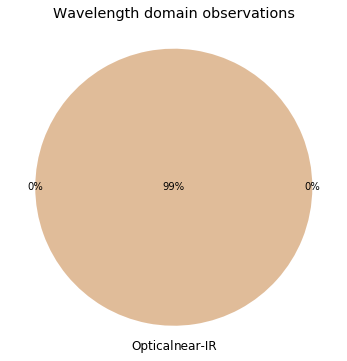

In [6]:
venn2(
    [
        np.sum(flag_obs == 1),
        np.sum(flag_obs == 2),
        np.sum(flag_obs == 3)
    ],
    set_labels=('Optical', 'near-IR'),
    subset_label_formatter=lambda x: "{}%".format(int(100*x/len(flag_obs)))
)
plt.title("Wavelength domain observations");

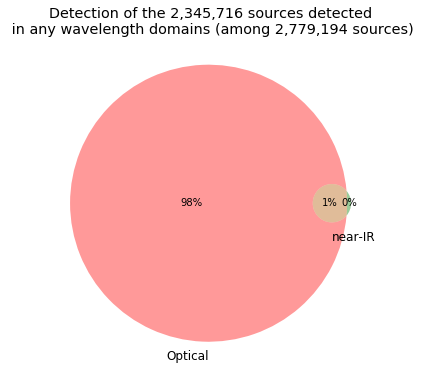

In [7]:
venn2(
    [
        np.sum(flag_det[flag_obs == 3] == 1),
        np.sum(flag_det[flag_obs == 3] == 2),
        np.sum(flag_det[flag_obs == 3] == 3)
    ],
    set_labels=('Optical', 'near-IR'),
    subset_label_formatter=lambda x: "{}%".format(int(100*x/np.sum(flag_det != 0)))
)
plt.title("Detection of the {} sources detected\n in any wavelength domains "
          "(among {} sources)".format(
              locale.format('%d', np.sum(flag_det != 0), grouping=True),
              locale.format('%d', len(flag_det), grouping=True)));

## II - Comparing magnitudes in similar filters

The master list if composed of several catalogues containing magnitudes in similar filters on different instruments. We are comparing the magnitudes in these corresponding filters.

In [8]:
u_bands = ["Megacam u",            "KIDS u"]
g_bands = ["Megacam g", "DECam g", "KIDS g", "SUPRIME g", "GPC1 g"]
r_bands = ["Megacam r", "DECam r", "KIDS r", "SUPRIME r", "GPC1 r"]
i_bands = ["Megacam i",            "KIDS i", "SUPRIME i", "GPC1 i"]
z_bands = ["Megacam z", "DECam z",           "SUPRIME z", "GPC1 z"]
y_bands = [                                      "SUPRIME y", "GPC1 y"]

### II.a - Comparing depths

We compare the histograms of the total aperture magnitudes of similar bands.

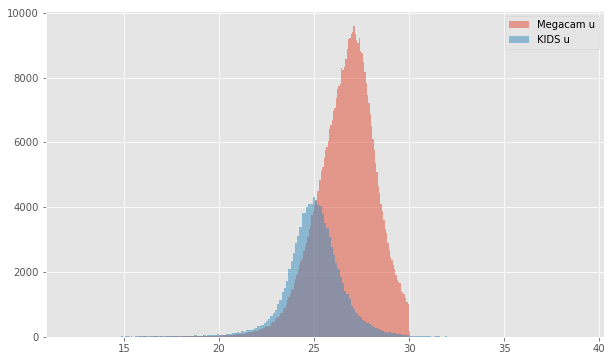

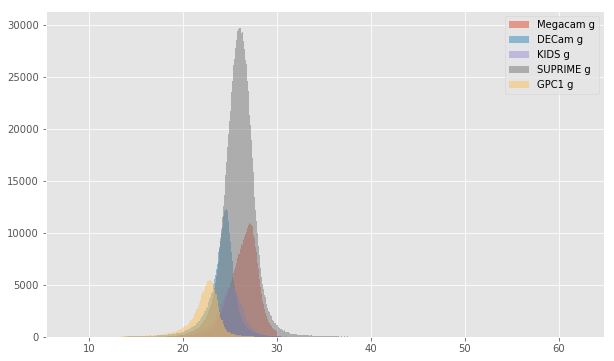

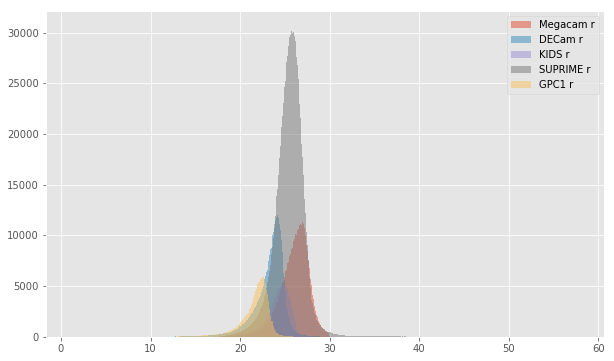

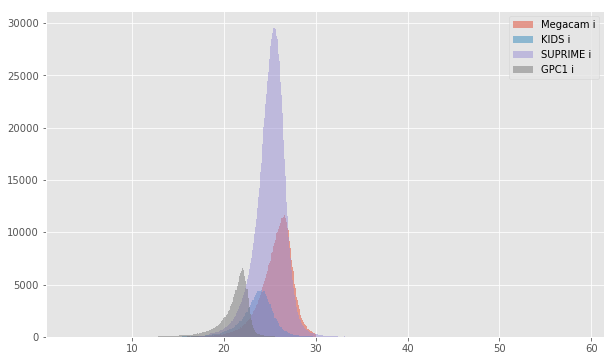

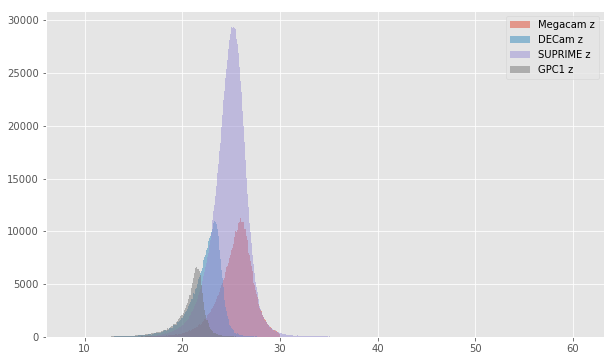

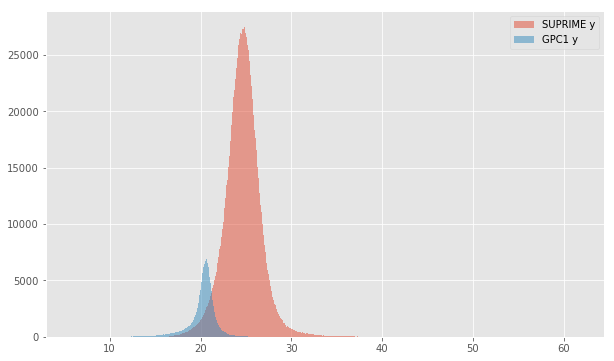

In [9]:
for bands in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands]:
    colnames = ["m_{}".format(band.replace(" ", "_").lower()) for band in bands]
    nb_histograms(master_catalogue, colnames, bands)

### II.b - Comparing magnitudes

We compare one to one each magnitude in similar bands.

KIDS u (aperture) - Megacam u (aperture):
- Median: 0.15
- Median Absolute Deviation: 0.40
- 1% percentile: -2.289331703186035
- 99% percentile: 2.664651012420655


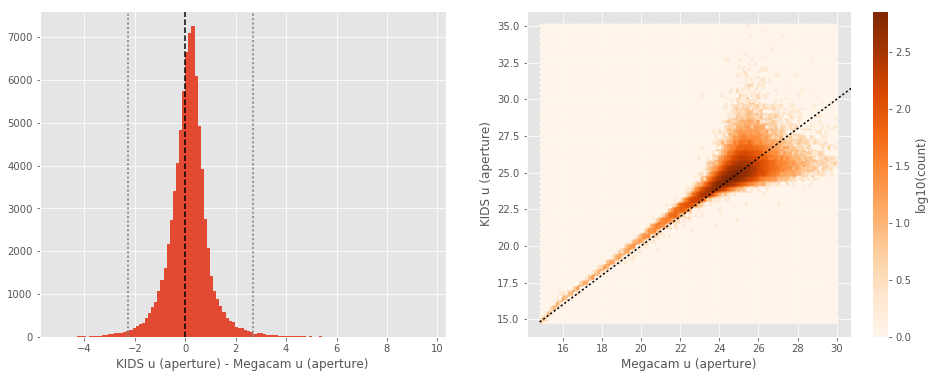

KIDS u (total) - Megacam u (total):
- Median: 0.30
- Median Absolute Deviation: 0.43
- 1% percentile: -2.038863296508789
- 99% percentile: 3.542579879760737


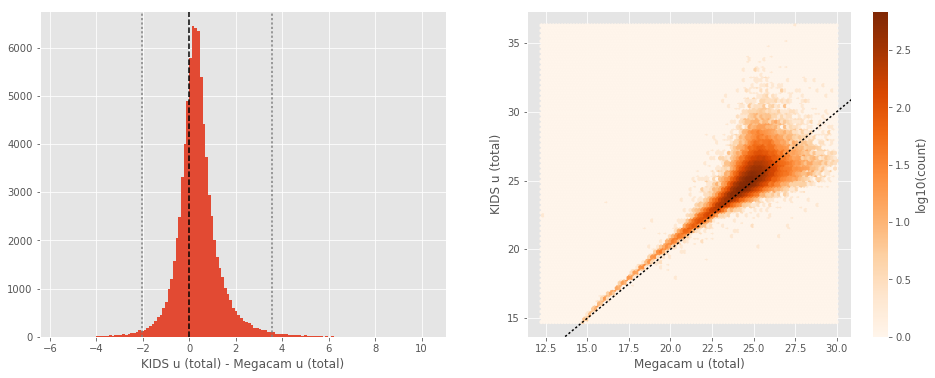

DECam g (aperture) - Megacam g (aperture):
- Median: -0.05
- Median Absolute Deviation: 0.24
- 1% percentile: -1.2481439590454102
- 99% percentile: 2.7848606109619167


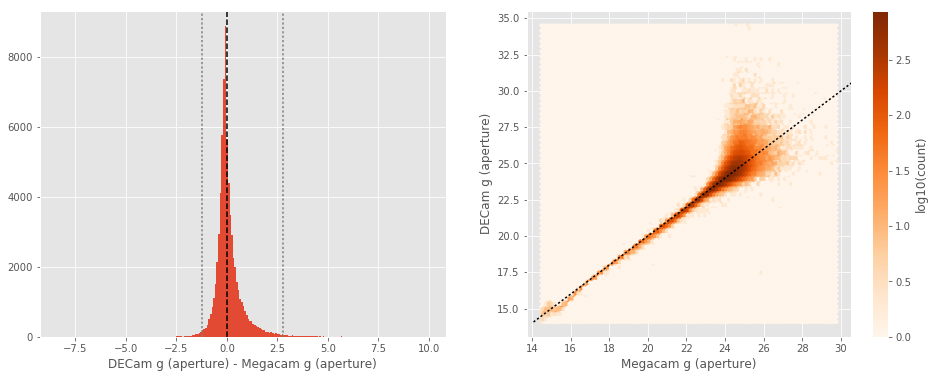

DECam g (total) - Megacam g (total):
- Median: 0.26
- Median Absolute Deviation: 0.21
- 1% percentile: -0.5215093994140625
- 99% percentile: 2.622013511657716


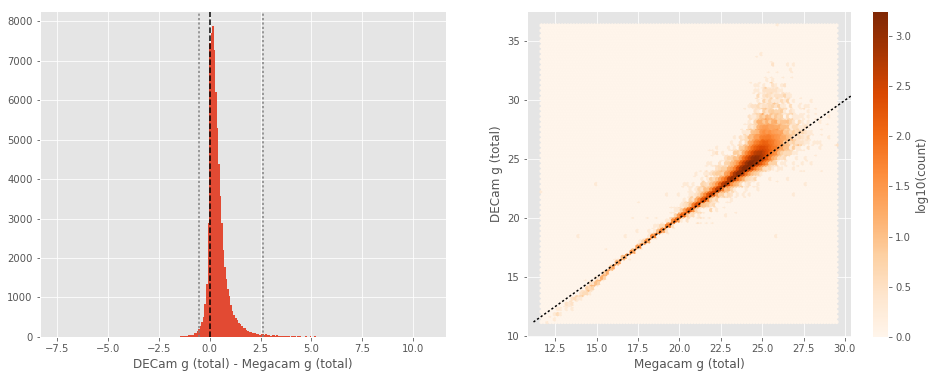

KIDS g (aperture) - Megacam g (aperture):
- Median: 0.21
- Median Absolute Deviation: 0.20
- 1% percentile: -0.8616609191894531
- 99% percentile: 2.0629606628417836


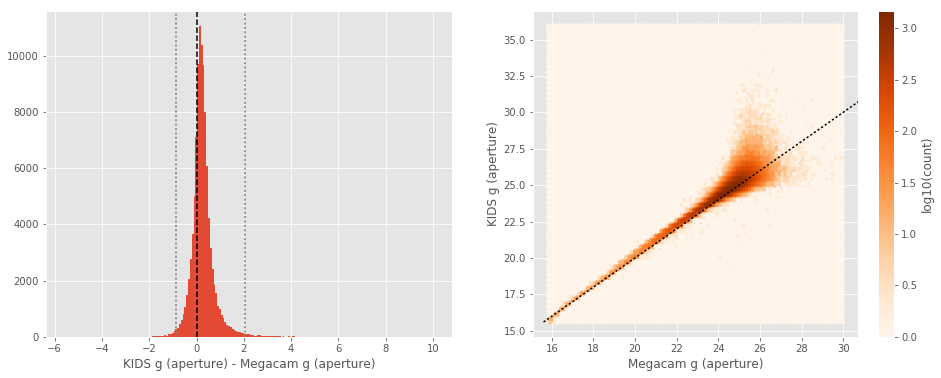

KIDS g (total) - Megacam g (total):
- Median: 0.49
- Median Absolute Deviation: 0.30
- 1% percentile: -0.48593807220458984
- 99% percentile: 3.219382667541507


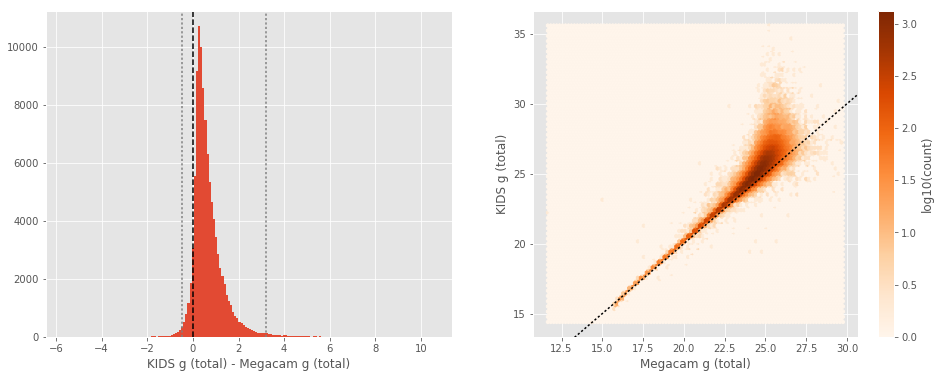

SUPRIME g (aperture) - Megacam g (aperture):
- Median: -0.00
- Median Absolute Deviation: 0.17
- 1% percentile: -1.3727685356140138
- 99% percentile: 2.1900751876831044


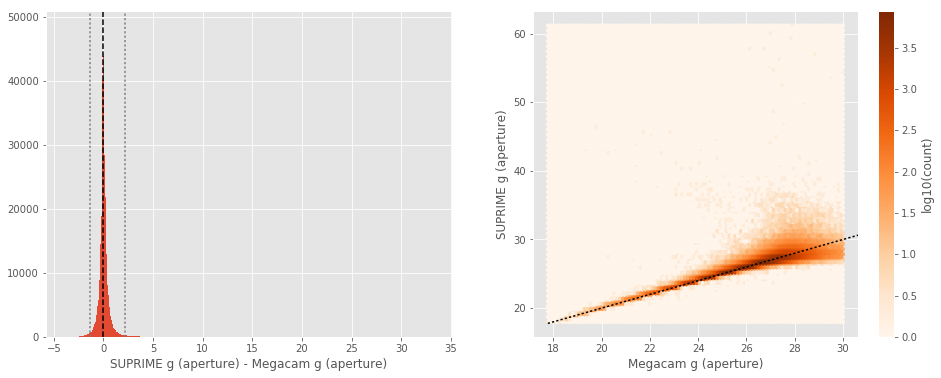

SUPRIME g (total) - Megacam g (total):
- Median: -0.01
- Median Absolute Deviation: 0.24
- 1% percentile: -2.487872428894043
- 99% percentile: 2.44462388992309


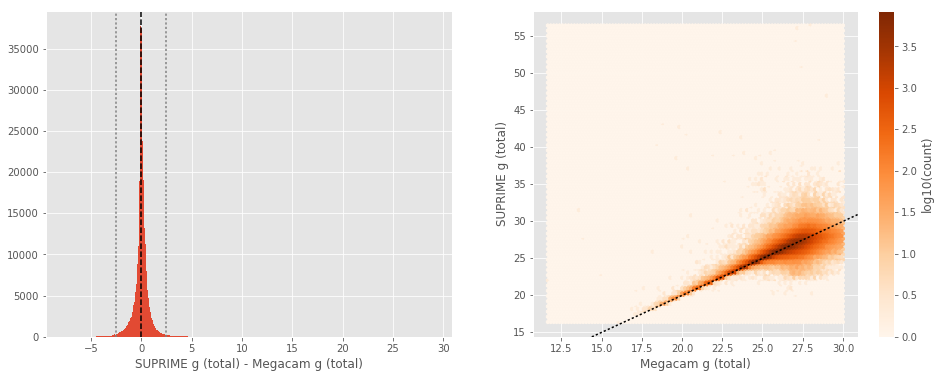

GPC1 g (aperture) - Megacam g (aperture):
- Median: -0.17
- Median Absolute Deviation: 0.32
- 1% percentile: -2.971248092651367
- 99% percentile: 2.6563667678833


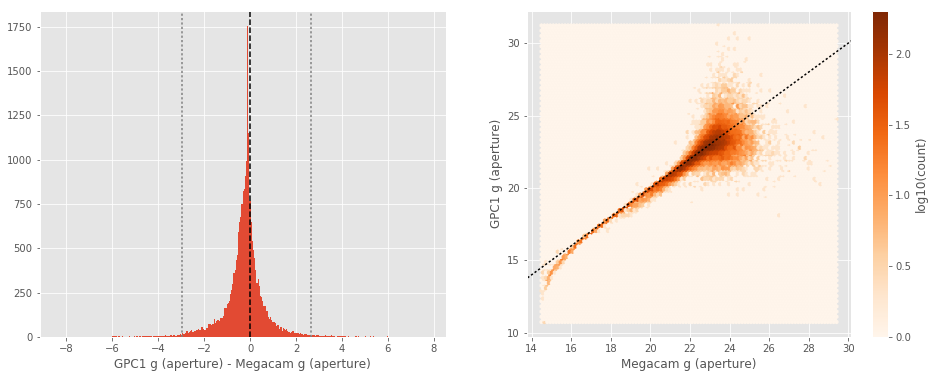

GPC1 g (total) - Megacam g (total):
- Median: 0.07
- Median Absolute Deviation: 0.28
- 1% percentile: -3.4746436309814452
- 99% percentile: 2.239927902221698


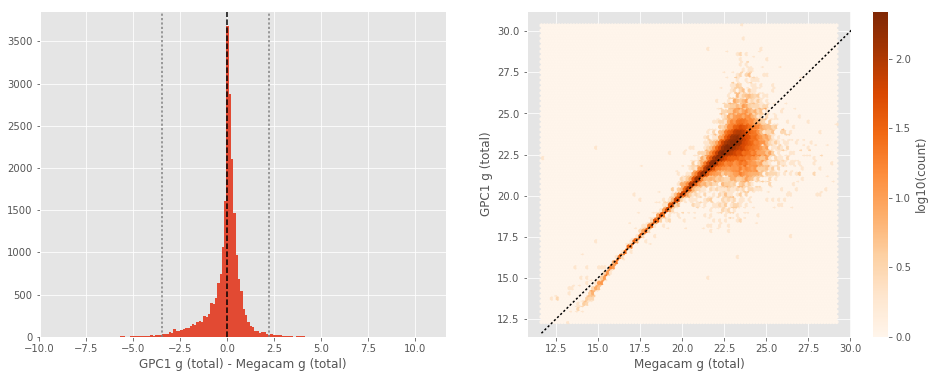

KIDS g (aperture) - DECam g (aperture):
- Median: 0.24
- Median Absolute Deviation: 0.30
- 1% percentile: -2.502174530029297
- 99% percentile: 1.829255371093745


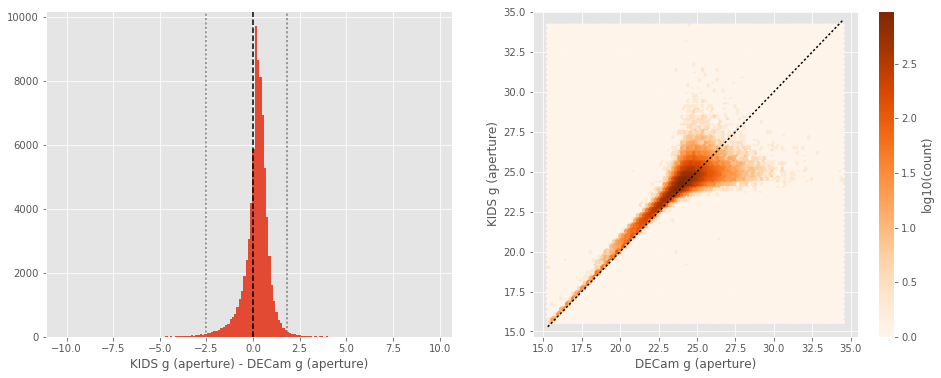

KIDS g (total) - DECam g (total):
- Median: 0.17
- Median Absolute Deviation: 0.25
- 1% percentile: -1.753904094696045
- 99% percentile: 2.109712429046628


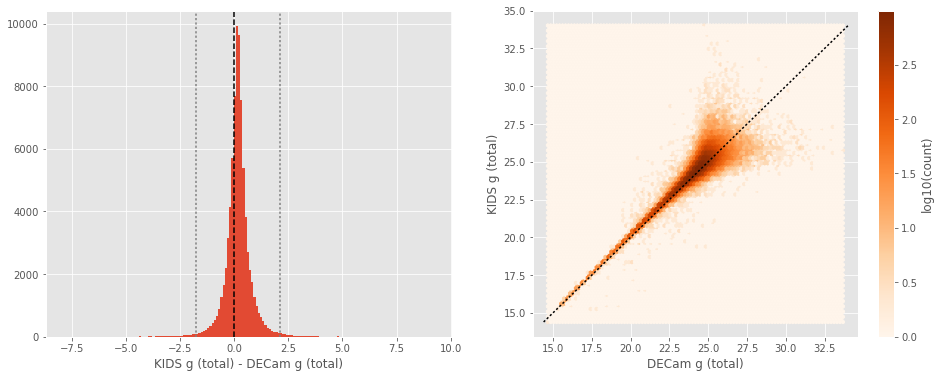

SUPRIME g (aperture) - DECam g (aperture):
- Median: 0.12
- Median Absolute Deviation: 0.31
- 1% percentile: -2.6941718292236327
- 99% percentile: 3.988408126831078


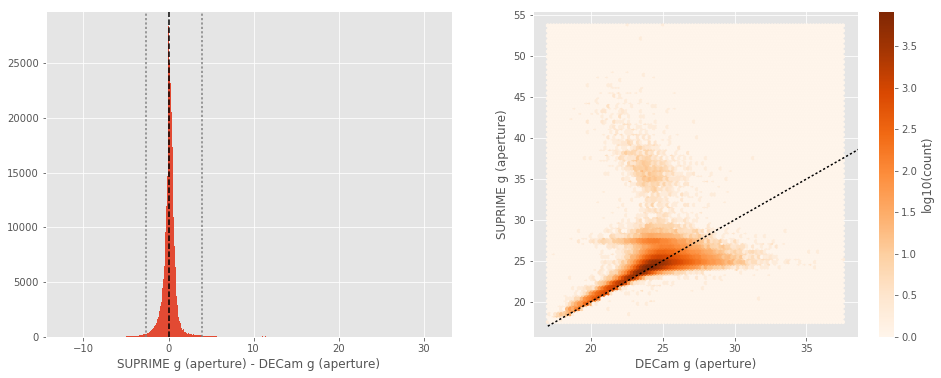

SUPRIME g (total) - DECam g (total):
- Median: -0.16
- Median Absolute Deviation: 0.23
- 1% percentile: -2.432461643218994
- 99% percentile: 3.2051278495788473


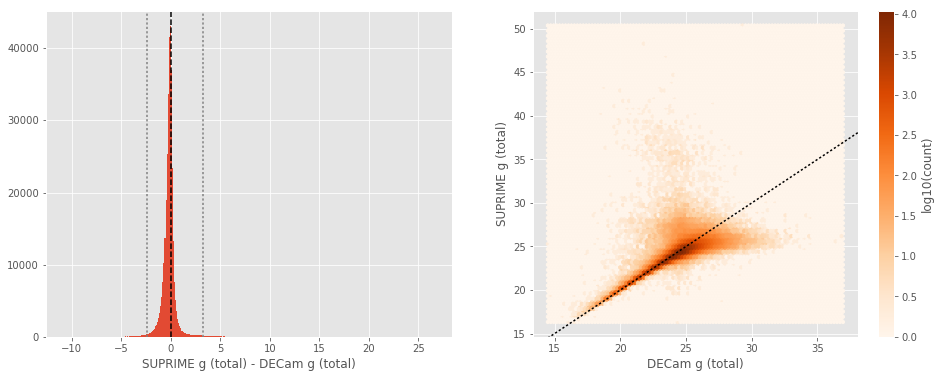

GPC1 g (aperture) - DECam g (aperture):
- Median: -0.07
- Median Absolute Deviation: 0.31
- 1% percentile: -3.1713577270507813
- 99% percentile: 2.64323902130127


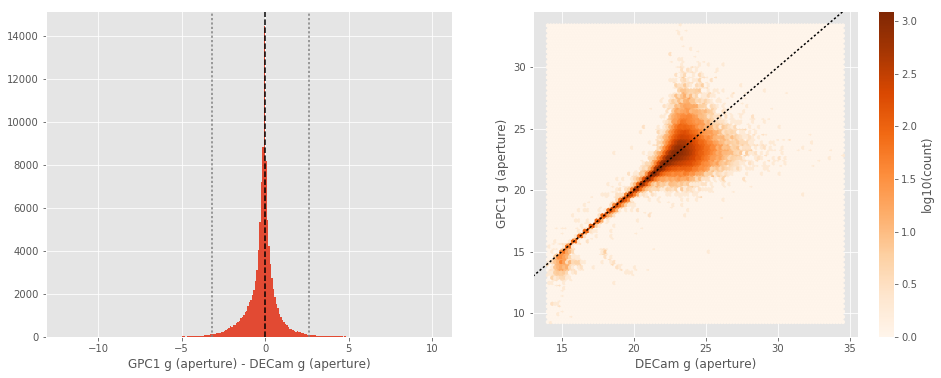

GPC1 g (total) - DECam g (total):
- Median: -0.00
- Median Absolute Deviation: 0.29
- 1% percentile: -3.62840633392334
- 99% percentile: 2.0448080062866225


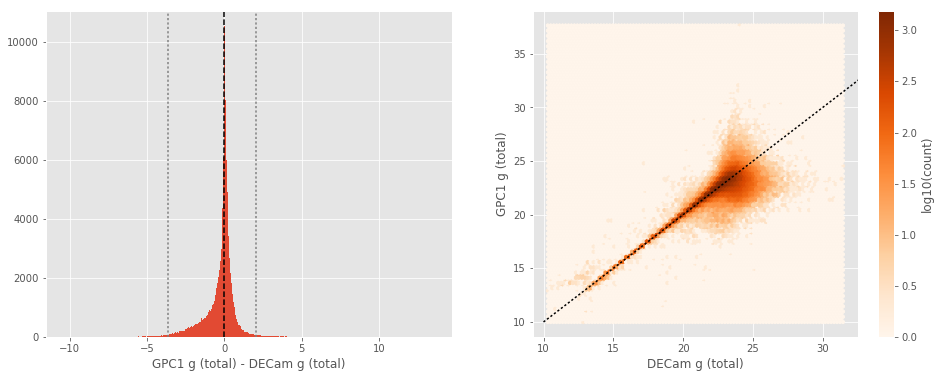

SUPRIME g (aperture) - KIDS g (aperture):
- Median: -0.13
- Median Absolute Deviation: 0.20
- 1% percentile: -2.0132504081726075
- 99% percentile: 1.312053031921387


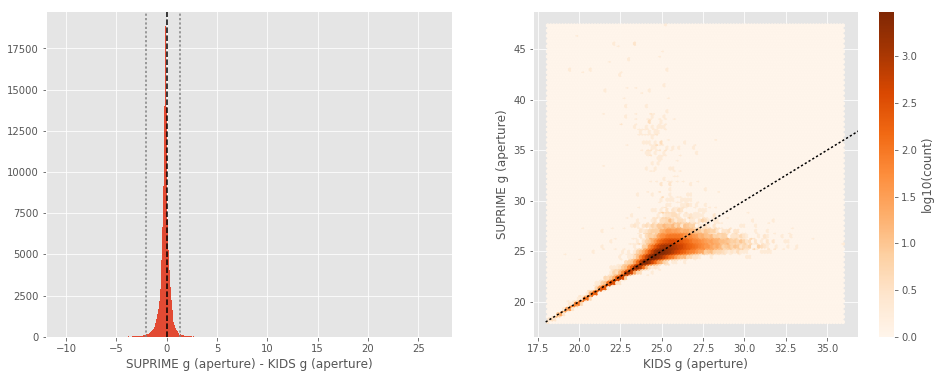

SUPRIME g (total) - KIDS g (total):
- Median: -0.44
- Median Absolute Deviation: 0.31
- 1% percentile: -3.1919830322265628
- 99% percentile: 1.440004119873048


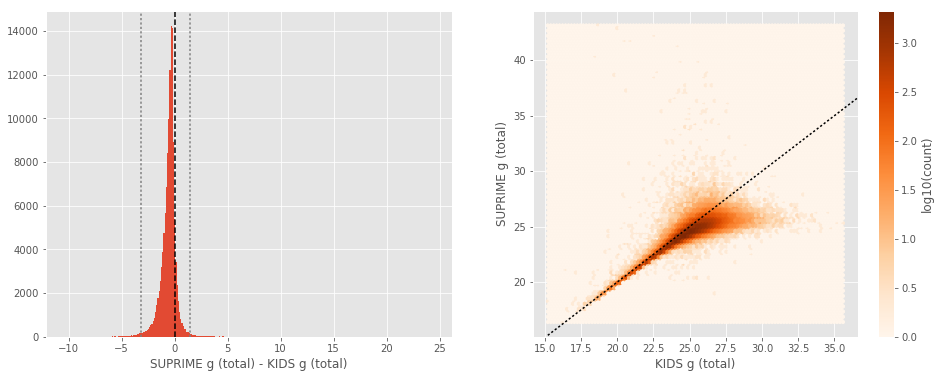

GPC1 g (aperture) - KIDS g (aperture):
- Median: -0.38
- Median Absolute Deviation: 0.38
- 1% percentile: -3.0642630577087404
- 99% percentile: 2.4360705947875974


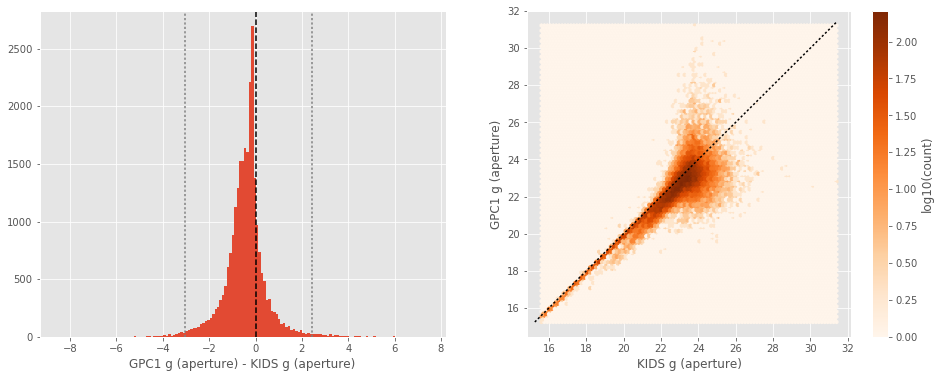

GPC1 g (total) - KIDS g (total):
- Median: -0.18
- Median Absolute Deviation: 0.29
- 1% percentile: -3.8469621086120607
- 99% percentile: 1.8934726333618062


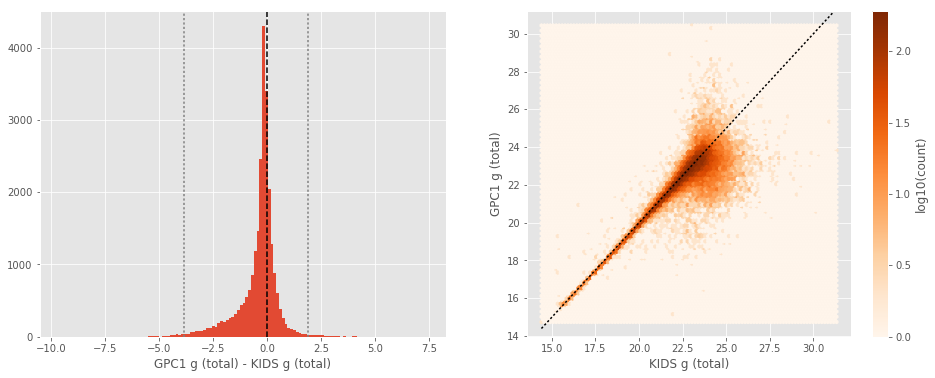

GPC1 g (aperture) - SUPRIME g (aperture):
- Median: -0.32
- Median Absolute Deviation: 0.44
- 1% percentile: -5.444828033447266
- 99% percentile: 2.6096390151977586


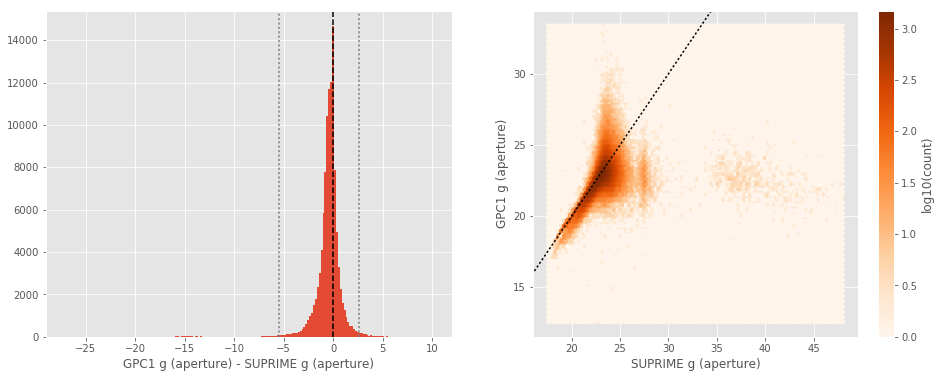

GPC1 g (total) - SUPRIME g (total):
- Median: -0.04
- Median Absolute Deviation: 0.36
- 1% percentile: -5.233756103515626
- 99% percentile: 2.1164352226257295


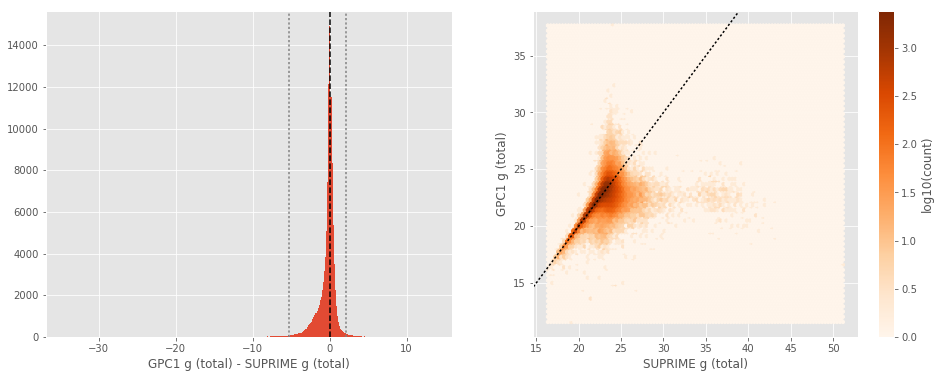

DECam r (aperture) - Megacam r (aperture):
- Median: -0.13
- Median Absolute Deviation: 0.20
- 1% percentile: -0.8681503295898437
- 99% percentile: 2.269659233093262


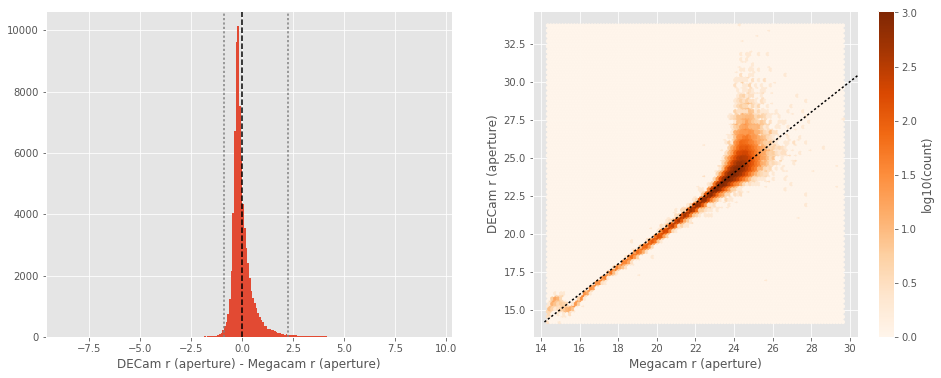

DECam r (total) - Megacam r (total):
- Median: 0.09
- Median Absolute Deviation: 0.19
- 1% percentile: -0.6512541961669922
- 99% percentile: 1.6617598724365095


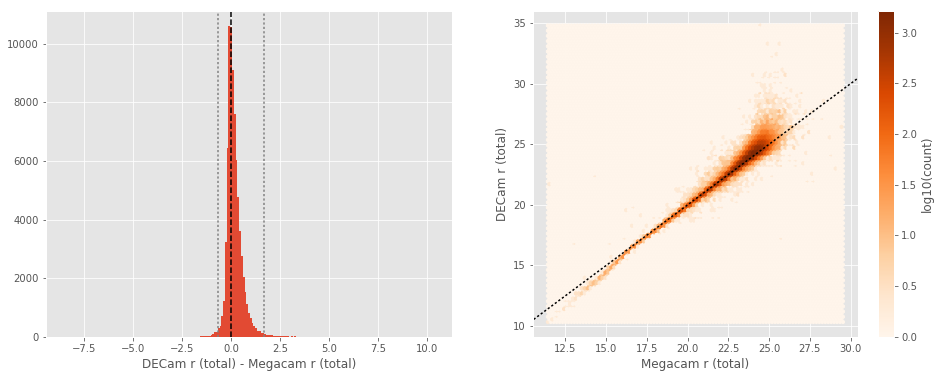

KIDS r (aperture) - Megacam r (aperture):
- Median: 0.07
- Median Absolute Deviation: 0.14
- 1% percentile: -0.8357596588134766
- 99% percentile: 0.920283718109131


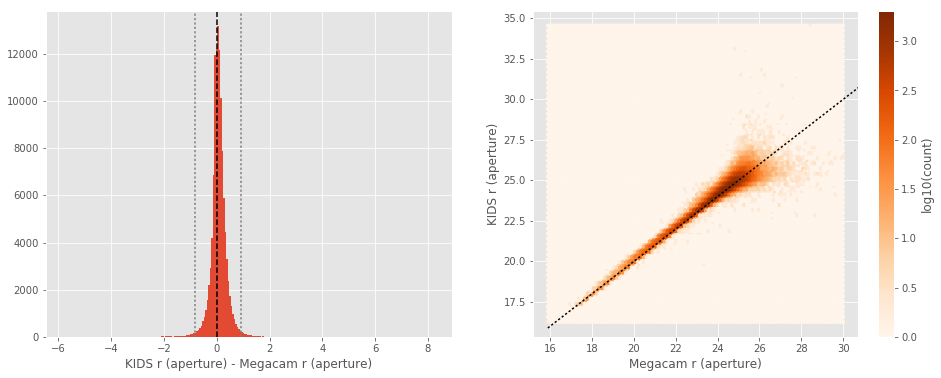

KIDS r (total) - Megacam r (total):
- Median: 0.20
- Median Absolute Deviation: 0.17
- 1% percentile: -0.6918363189697266
- 99% percentile: 1.3556387138366697


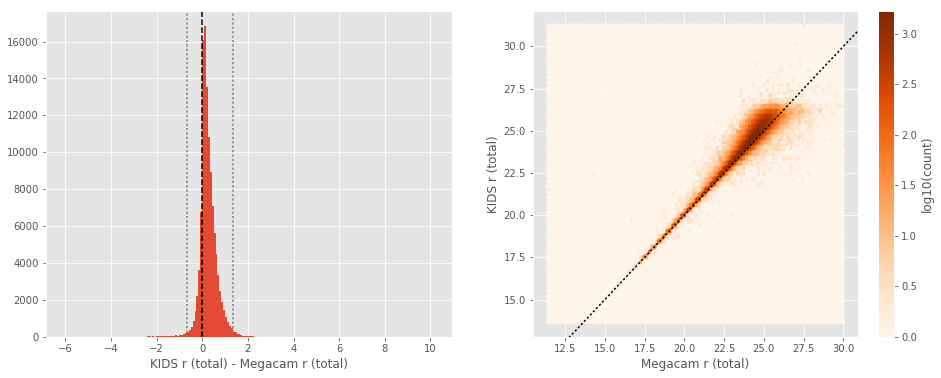

SUPRIME r (aperture) - Megacam r (aperture):
- Median: -0.04
- Median Absolute Deviation: 0.17
- 1% percentile: -1.5472402572631836
- 99% percentile: 1.5144849014282227


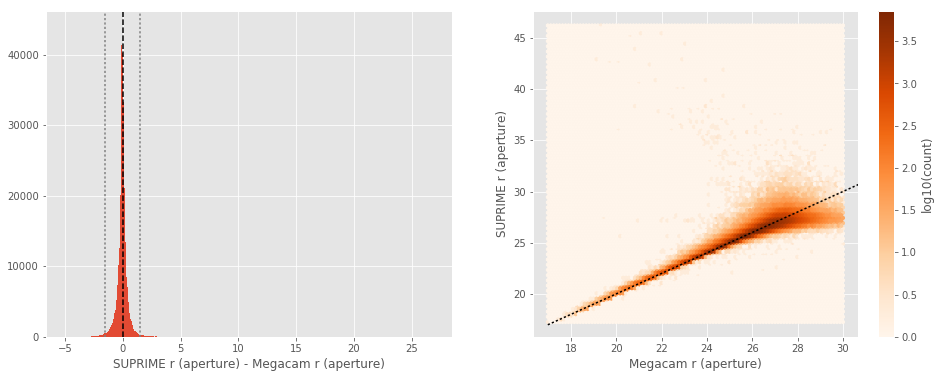

SUPRIME r (total) - Megacam r (total):
- Median: -0.11
- Median Absolute Deviation: 0.22
- 1% percentile: -2.5586280822753906
- 99% percentile: 1.996949577331535


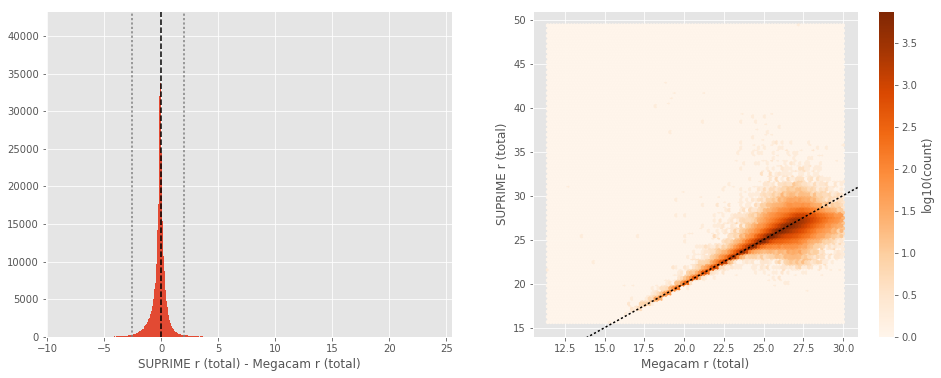

GPC1 r (aperture) - Megacam r (aperture):
- Median: -0.10
- Median Absolute Deviation: 0.19
- 1% percentile: -1.9410191535949708
- 99% percentile: 1.6266898155212433


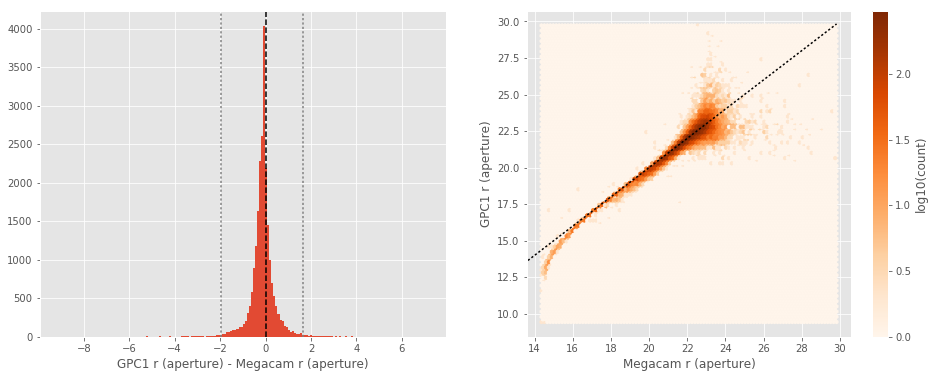

GPC1 r (total) - Megacam r (total):
- Median: 0.12
- Median Absolute Deviation: 0.15
- 1% percentile: -2.388612747192383
- 99% percentile: 1.45269229888916


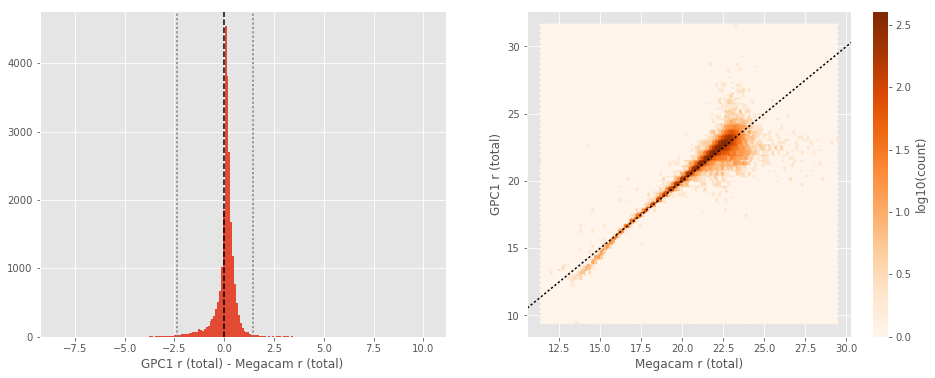

KIDS r (aperture) - DECam r (aperture):
- Median: 0.19
- Median Absolute Deviation: 0.24
- 1% percentile: -2.0812751770019533
- 99% percentile: 1.1308261871337906


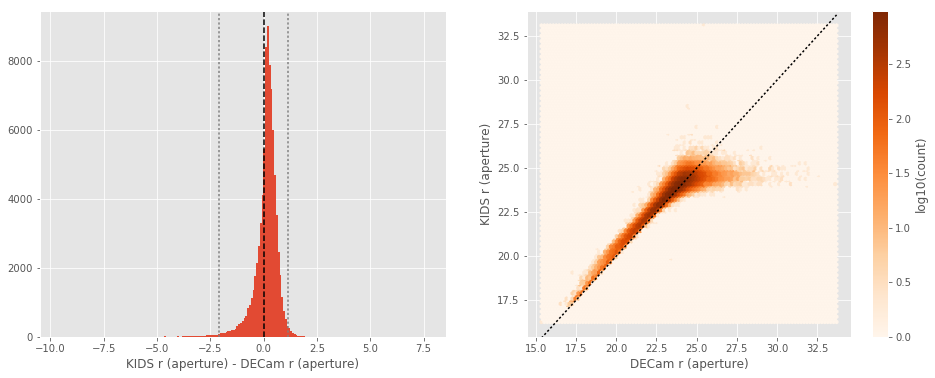

KIDS r (total) - DECam r (total):
- Median: 0.11
- Median Absolute Deviation: 0.18
- 1% percentile: -1.138597011566162
- 99% percentile: 1.1307144165039062


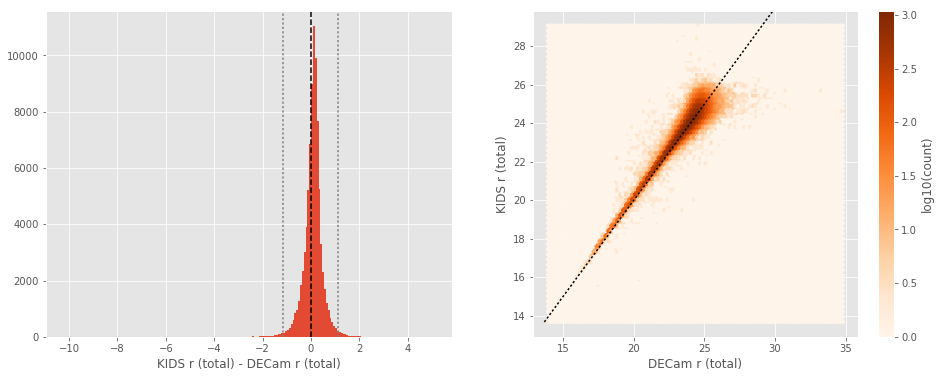

SUPRIME r (aperture) - DECam r (aperture):
- Median: 0.18
- Median Absolute Deviation: 0.27
- 1% percentile: -2.1634254455566406
- 99% percentile: 14.466812896728527


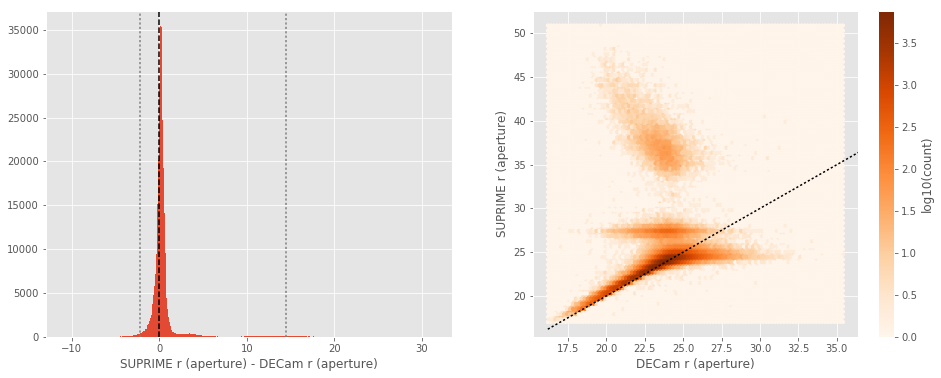

SUPRIME r (total) - DECam r (total):
- Median: -0.07
- Median Absolute Deviation: 0.21
- 1% percentile: -1.6294122505187987
- 99% percentile: 10.362137470245345


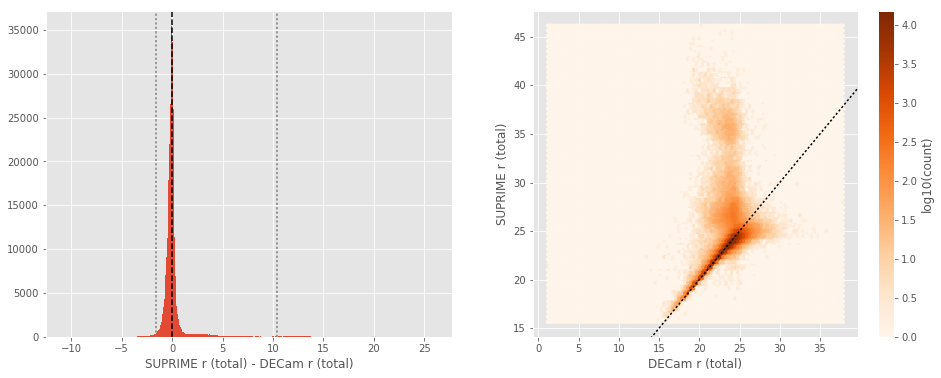

GPC1 r (aperture) - DECam r (aperture):
- Median: 0.11
- Median Absolute Deviation: 0.18
- 1% percentile: -1.9238129806518556
- 99% percentile: 1.8205731201171866


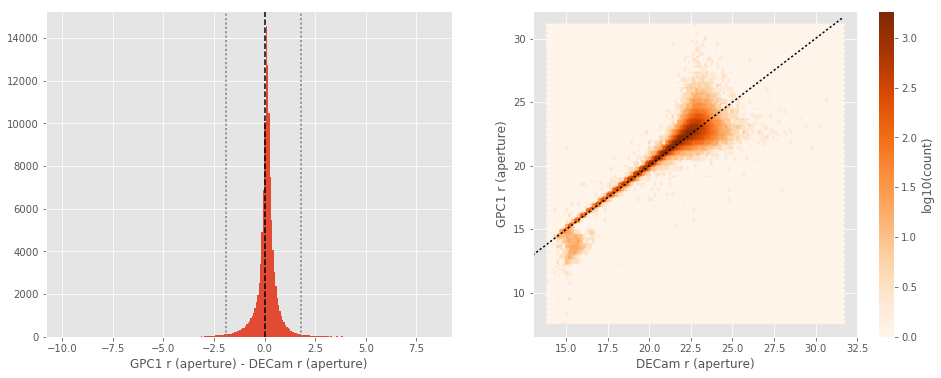

GPC1 r (total) - DECam r (total):
- Median: 0.19
- Median Absolute Deviation: 0.17
- 1% percentile: -2.1555244445800783
- 99% percentile: 1.6214006423950202


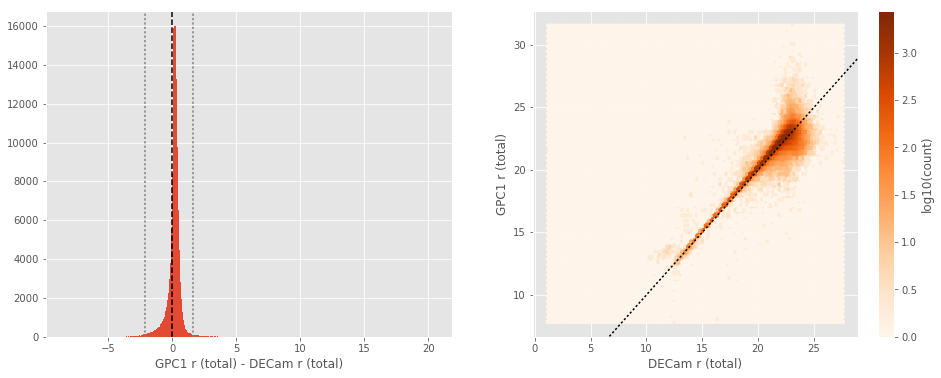

SUPRIME r (aperture) - KIDS r (aperture):
- Median: -0.04
- Median Absolute Deviation: 0.12
- 1% percentile: -0.8950873947143554
- 99% percentile: 1.3212809181213354


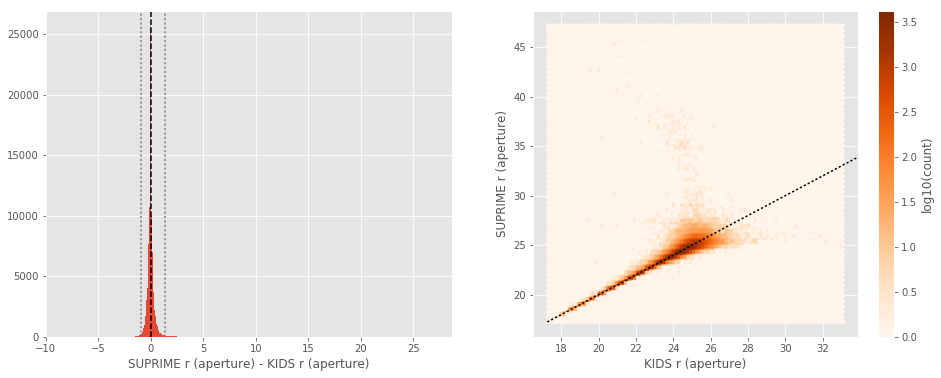

SUPRIME r (total) - KIDS r (total):
- Median: -0.25
- Median Absolute Deviation: 0.19
- 1% percentile: -1.4168214416503906
- 99% percentile: 1.6143164825439458


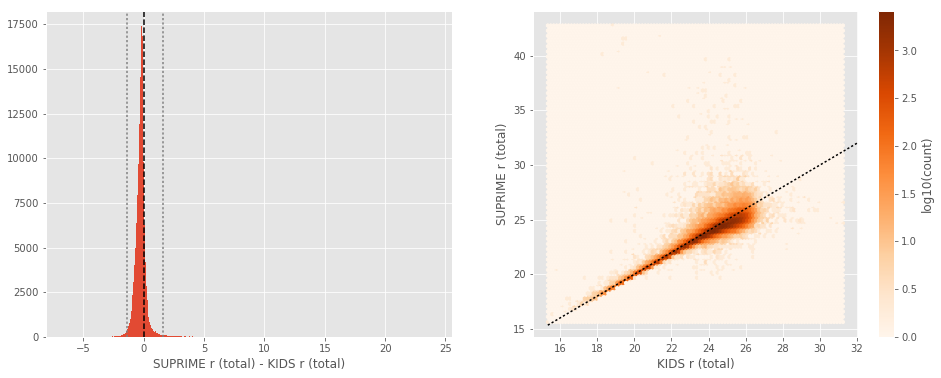

GPC1 r (aperture) - KIDS r (aperture):
- Median: -0.15
- Median Absolute Deviation: 0.26
- 1% percentile: -1.7364138793945312
- 99% percentile: 1.6038119888305666


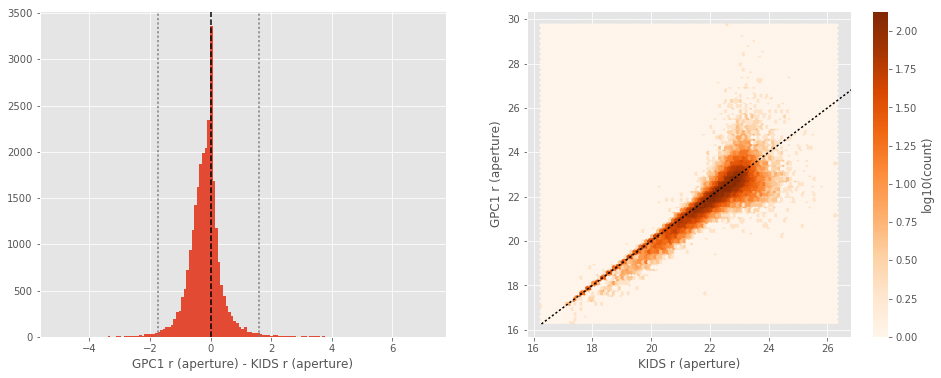

GPC1 r (total) - KIDS r (total):
- Median: 0.05
- Median Absolute Deviation: 0.16
- 1% percentile: -2.239205780029297
- 99% percentile: 1.2124087905883782


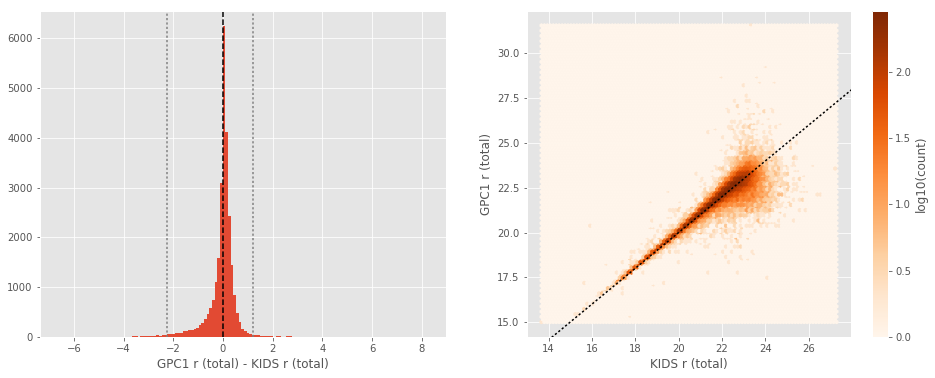

GPC1 r (aperture) - SUPRIME r (aperture):
- Median: -0.18
- Median Absolute Deviation: 0.29
- 1% percentile: -17.90644989013672
- 99% percentile: 1.6656947135925286


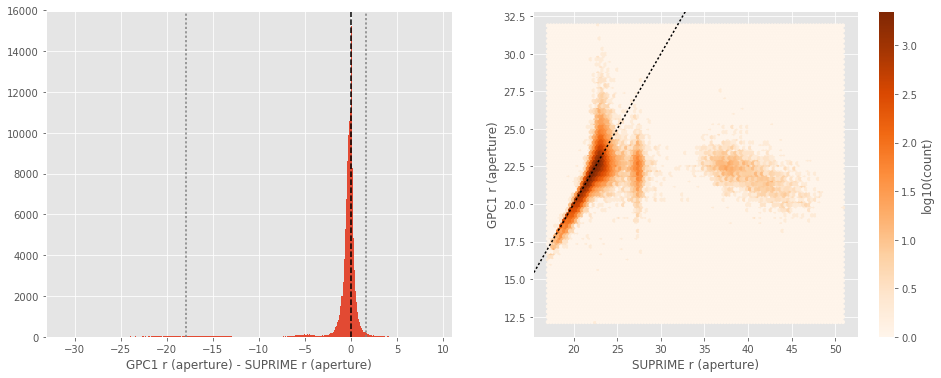

GPC1 r (total) - SUPRIME r (total):
- Median: 0.14
- Median Absolute Deviation: 0.20
- 1% percentile: -13.33275733947754
- 99% percentile: 1.4203444671630852


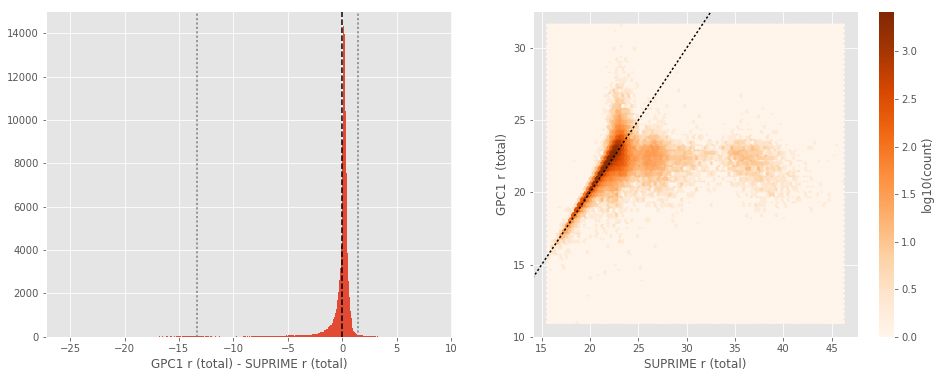

KIDS i (aperture) - Megacam i (aperture):
- Median: 0.10
- Median Absolute Deviation: 0.23
- 1% percentile: -1.2901405334472655
- 99% percentile: 2.2804393005371058


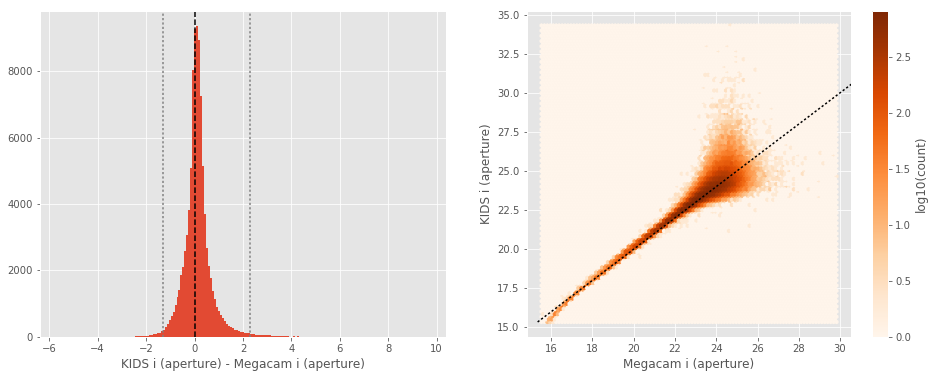

KIDS i (total) - Megacam i (total):
- Median: 0.30
- Median Absolute Deviation: 0.30
- 1% percentile: -0.8911037445068358
- 99% percentile: 3.329991149902342


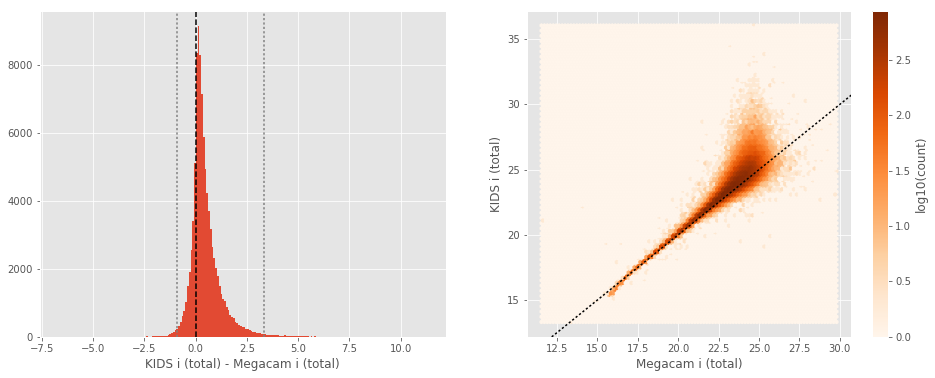

SUPRIME i (aperture) - Megacam i (aperture):
- Median: -0.02
- Median Absolute Deviation: 0.18
- 1% percentile: -1.6956094360351561
- 99% percentile: 1.6799184417724655


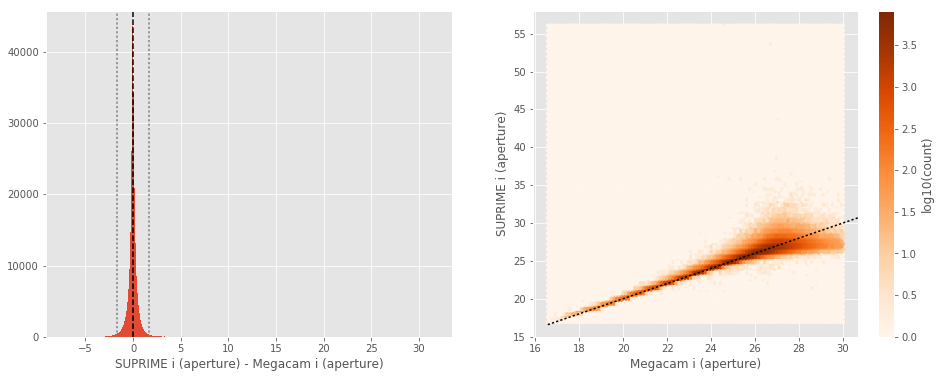

SUPRIME i (total) - Megacam i (total):
- Median: -0.08
- Median Absolute Deviation: 0.24
- 1% percentile: -2.6978379821777345
- 99% percentile: 2.0625018310546874


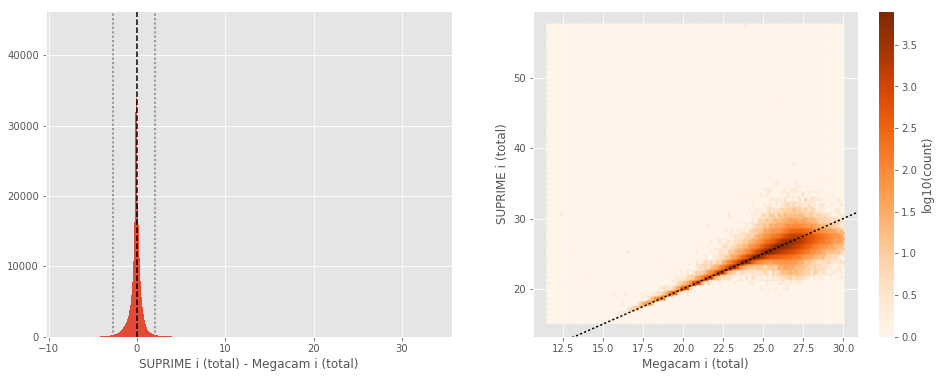

GPC1 i (aperture) - Megacam i (aperture):
- Median: -0.09
- Median Absolute Deviation: 0.15
- 1% percentile: -1.4649522781372069
- 99% percentile: 1.2202685546875007


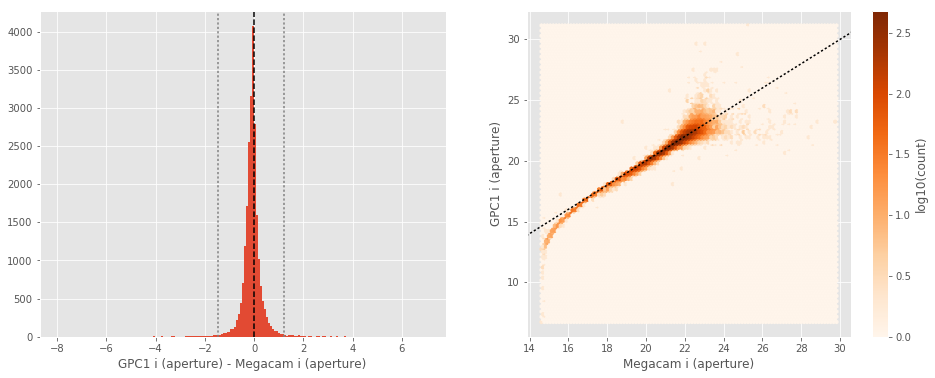

GPC1 i (total) - Megacam i (total):
- Median: 0.16
- Median Absolute Deviation: 0.12
- 1% percentile: -1.2191693878173828
- 99% percentile: 1.069381637573249


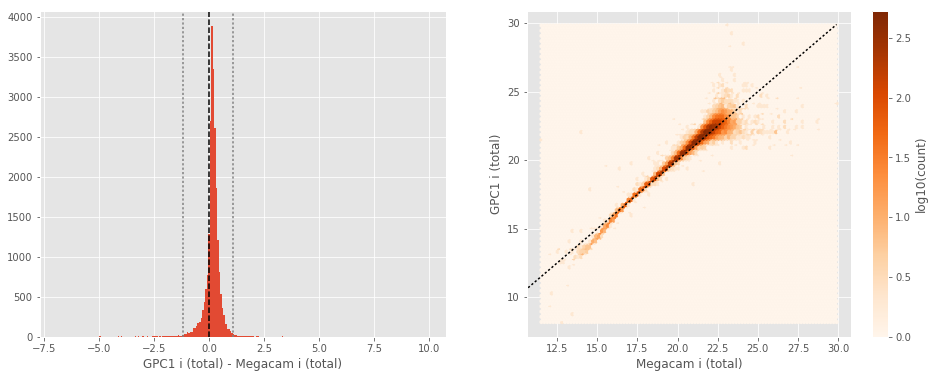

SUPRIME i (aperture) - KIDS i (aperture):
- Median: -0.06
- Median Absolute Deviation: 0.23
- 1% percentile: -2.2342630004882813
- 99% percentile: 1.456025543212891


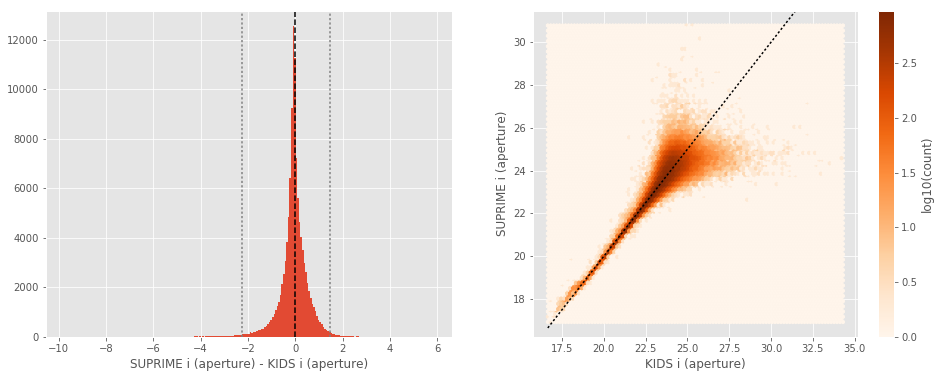

SUPRIME i (total) - KIDS i (total):
- Median: -0.33
- Median Absolute Deviation: 0.33
- 1% percentile: -3.3811874389648438
- 99% percentile: 1.3634872436523438


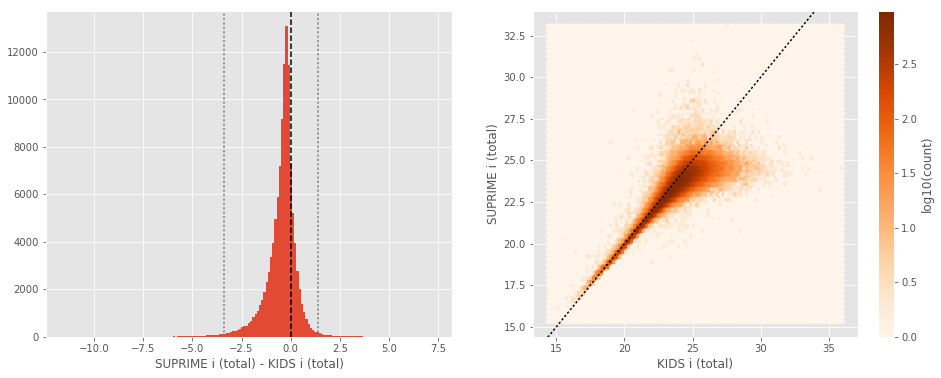

GPC1 i (aperture) - KIDS i (aperture):
- Median: -0.17
- Median Absolute Deviation: 0.20
- 1% percentile: -1.3024194717407227
- 99% percentile: 1.1682369232177683


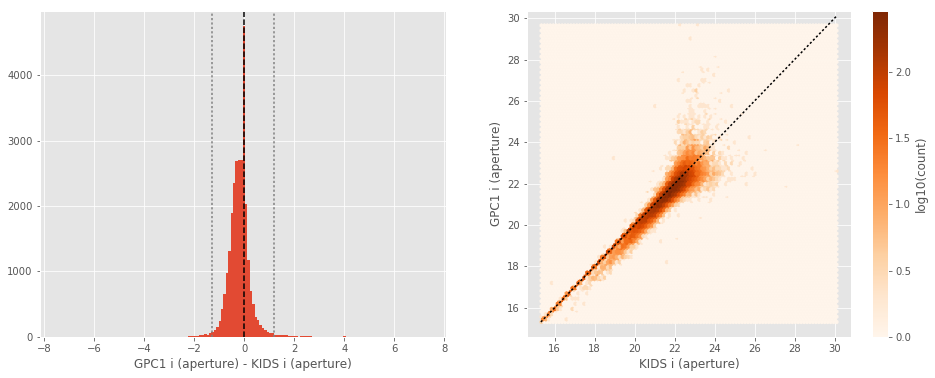

GPC1 i (total) - KIDS i (total):
- Median: 0.01
- Median Absolute Deviation: 0.14
- 1% percentile: -1.5711121368408203
- 99% percentile: 0.8988835525512694


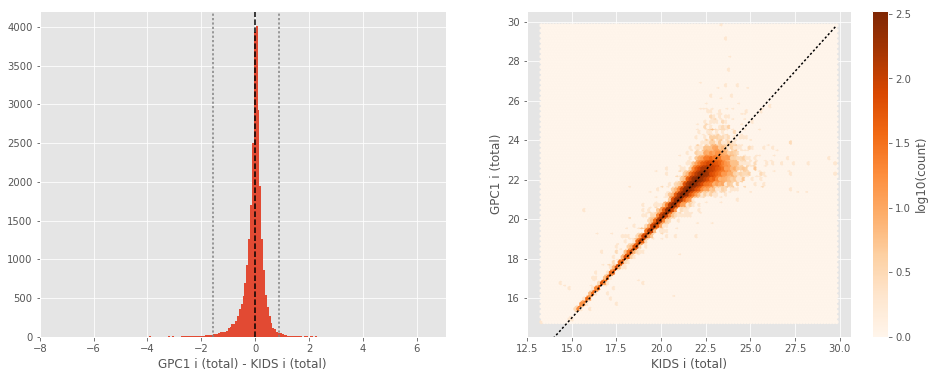

GPC1 i (aperture) - SUPRIME i (aperture):
- Median: -0.12
- Median Absolute Deviation: 0.23
- 1% percentile: -1.646259536743164
- 99% percentile: 1.3540364074707063


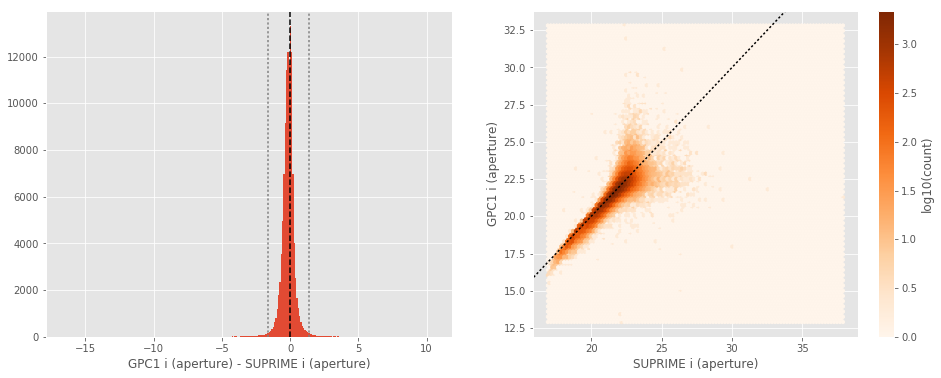

GPC1 i (total) - SUPRIME i (total):
- Median: 0.18
- Median Absolute Deviation: 0.15
- 1% percentile: -1.6534666633605957
- 99% percentile: 1.0704294586181642


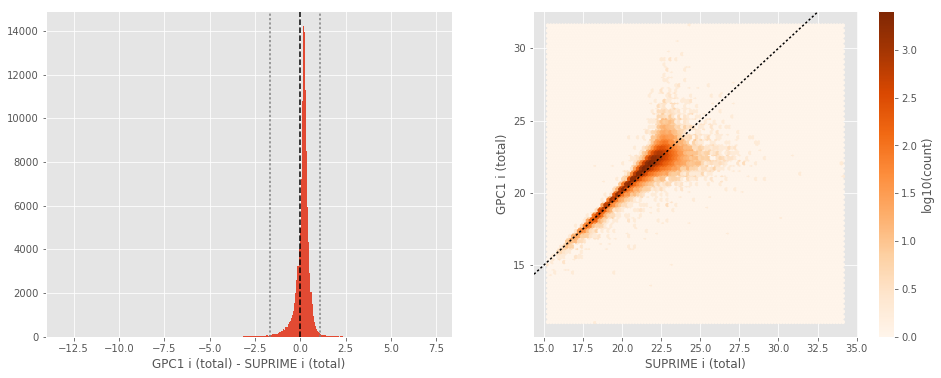

No sources have both Megacam z (aperture) and DECam z (aperture) values.
DECam z (total) - Megacam z (total):
- Median: -0.02
- Median Absolute Deviation: 0.16
- 1% percentile: -0.8012932777404785
- 99% percentile: 1.4513275146484492


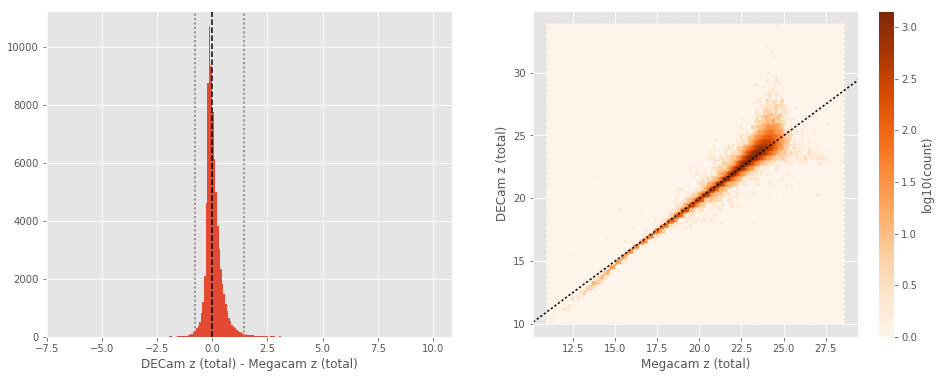

SUPRIME z (aperture) - Megacam z (aperture):
- Median: -0.07
- Median Absolute Deviation: 0.23
- 1% percentile: -2.3648147583007812
- 99% percentile: 2.137202262878418


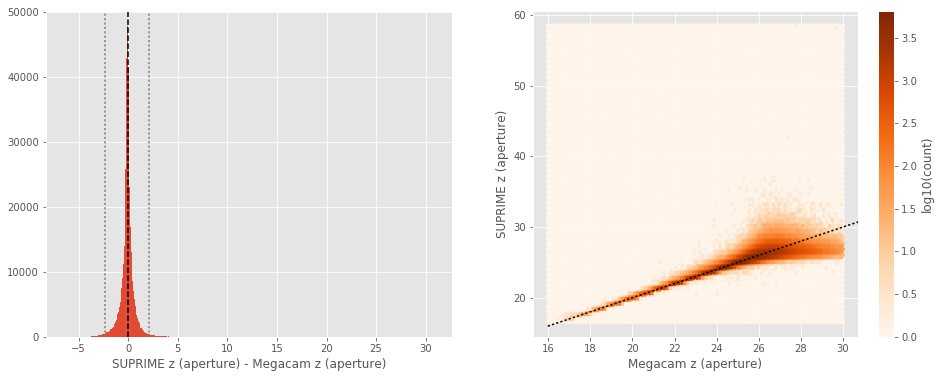

SUPRIME z (total) - Megacam z (total):
- Median: -0.14
- Median Absolute Deviation: 0.28
- 1% percentile: -3.0843325233459473
- 99% percentile: 2.309737834930417


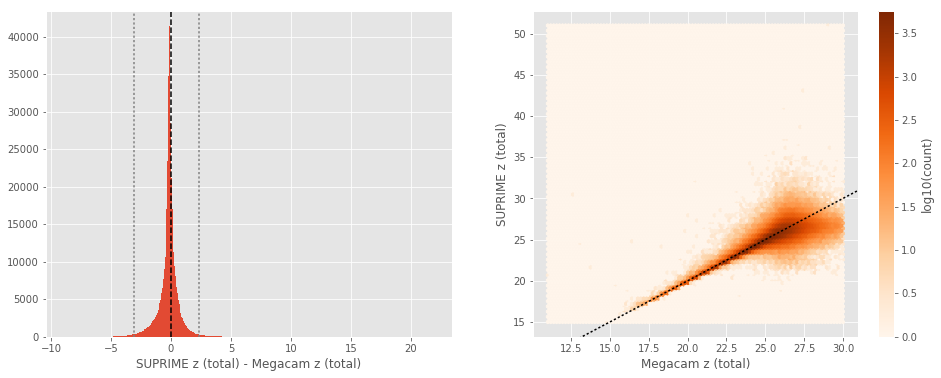

GPC1 z (aperture) - Megacam z (aperture):
- Median: -0.14
- Median Absolute Deviation: 0.17
- 1% percentile: -1.7039887619018554
- 99% percentile: 1.5755089950561514


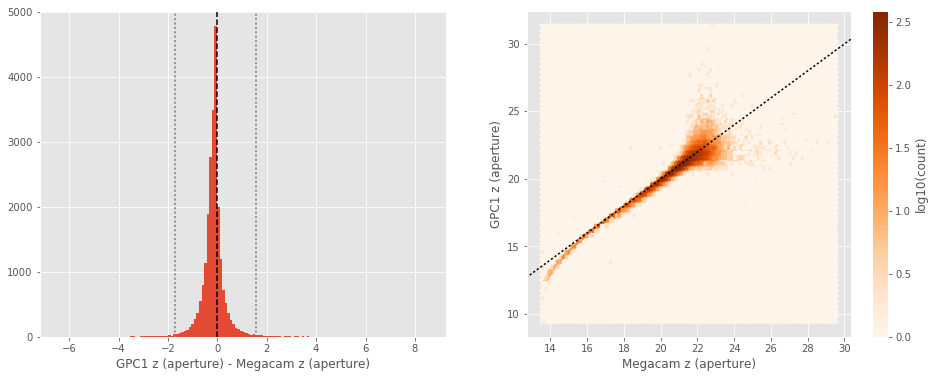

GPC1 z (total) - Megacam z (total):
- Median: 0.10
- Median Absolute Deviation: 0.15
- 1% percentile: -1.8154647827148436
- 99% percentile: 1.3765792083740254


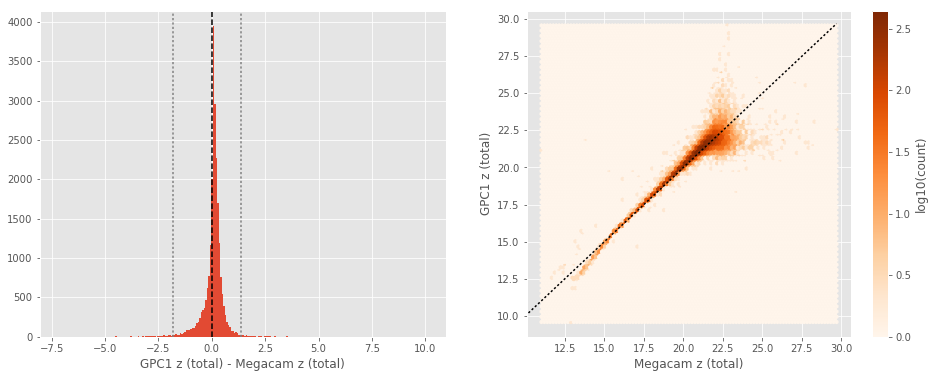

No sources have both DECam z (aperture) and SUPRIME z (aperture) values.
SUPRIME z (total) - DECam z (total):
- Median: -0.06
- Median Absolute Deviation: 0.17
- 1% percentile: -1.4441093444824218
- 99% percentile: 3.9348754501342404


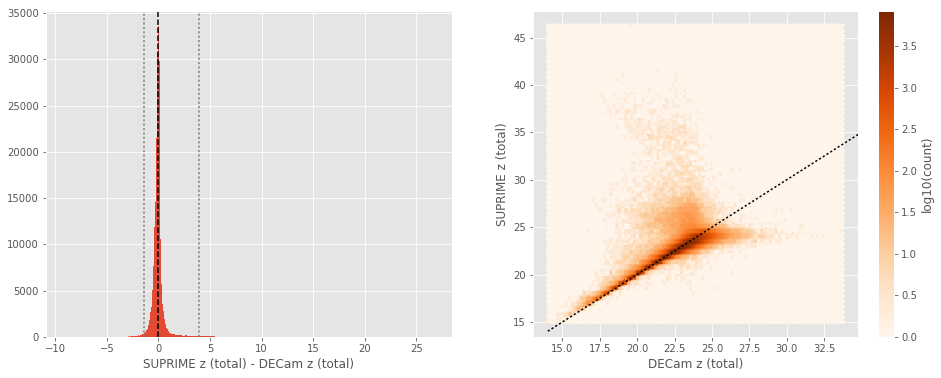

No sources have both DECam z (aperture) and GPC1 z (aperture) values.
GPC1 z (total) - DECam z (total):
- Median: 0.23
- Median Absolute Deviation: 0.16
- 1% percentile: -1.7236251831054688
- 99% percentile: 1.5656242370605469


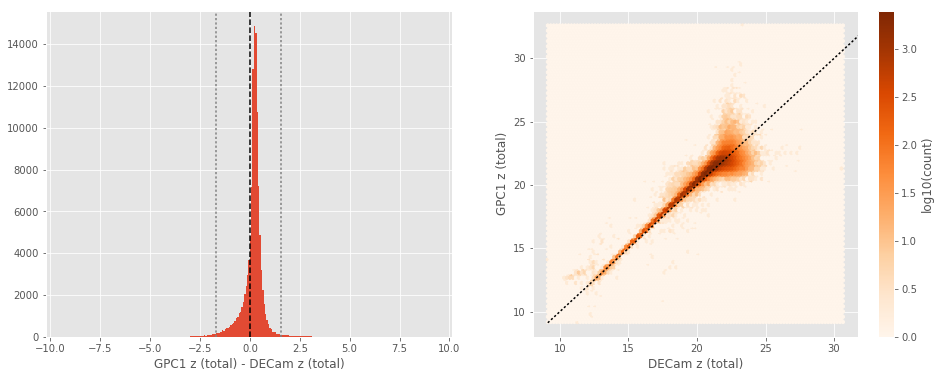

GPC1 z (aperture) - SUPRIME z (aperture):
- Median: -0.13
- Median Absolute Deviation: 0.26
- 1% percentile: -5.637487907409668
- 99% percentile: 1.6668732452392658


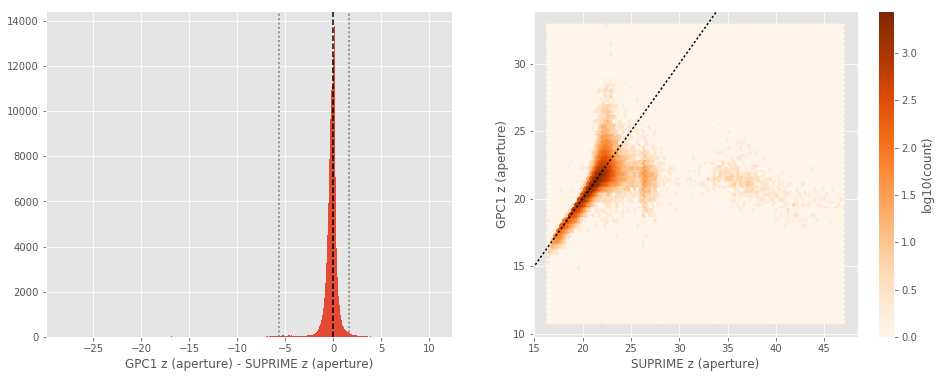

GPC1 z (total) - SUPRIME z (total):
- Median: 0.19
- Median Absolute Deviation: 0.18
- 1% percentile: -5.06588077545166
- 99% percentile: 1.4522491455078124


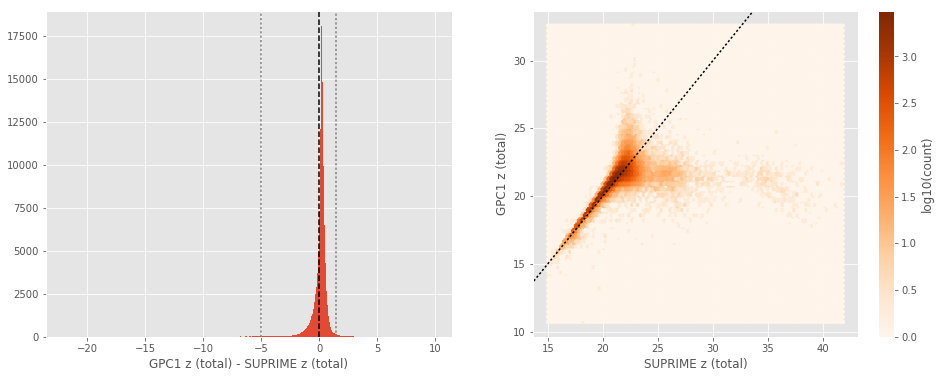

GPC1 y (aperture) - SUPRIME y (aperture):
- Median: -0.36
- Median Absolute Deviation: 0.40
- 1% percentile: -4.261415328979492
- 99% percentile: 1.8999283218383725


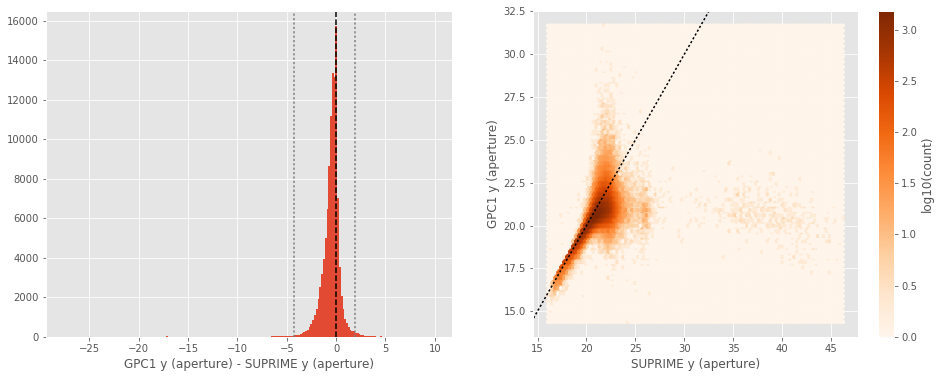

GPC1 y (total) - SUPRIME y (total):
- Median: -0.04
- Median Absolute Deviation: 0.41
- 1% percentile: -4.285578727722168
- 99% percentile: 1.9863888740539288


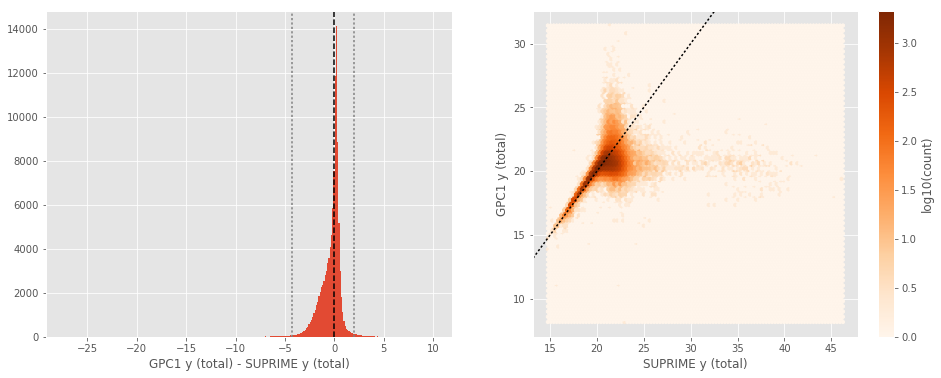

In [10]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands]:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):
        
        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
        
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        nb_compare_mags(master_catalogue[col1], master_catalogue[col2], 
                        labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)))
        
        col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
        nb_compare_mags(master_catalogue[col1], master_catalogue[col2], 
                        labels=("{} (total)".format(band1), "{} (total)".format(band2)))

## III - Comparing magnitudes to reference bands

Cross-match the master list to SDSS and 2MASS to compare its magnitudes to SDSS and 2MASS ones.

In [11]:
master_catalogue_coords = SkyCoord(master_catalogue['ra'], master_catalogue['dec'])

### III.a - Comparing u, g, r, i, and z bands to SDSS

The catalogue is cross-matched to SDSS-DR13 withing 0.2 arcsecond. 

We compare the u, g, r, i, and z magnitudes to those from SDSS using `fiberMag` for the aperture magnitude and `petroMag`  for the total magnitude.

In [12]:
sdss = Table.read("../../dmu0/dmu0_SDSS-DR13/data/SDSS-DR13_COSMOS.fits")
sdss_coords = SkyCoord(sdss['ra'] * u.deg, sdss['dec'] * u.deg)

idx, d2d, _ = sdss_coords.match_to_catalog_sky(master_catalogue_coords)
mask = (d2d < 0.2 * u.arcsec)

sdss = sdss[mask]
ml_sdss_idx = idx[mask]

Megacam u (aperture) - SDSS u (fiberMag):
- Median: -0.23
- Median Absolute Deviation: 0.48
- 1% percentile: -1.9805518150329589
- 99% percentile: 2.8978856086730964


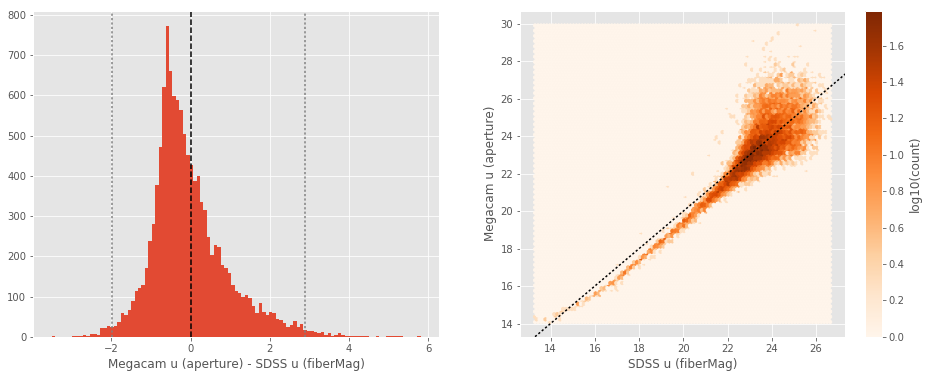

Megacam u (total) - SDSS u (petroMag):
- Median: -0.07
- Median Absolute Deviation: 0.81
- 1% percentile: -4.32380428314209
- 99% percentile: 3.993292770385745


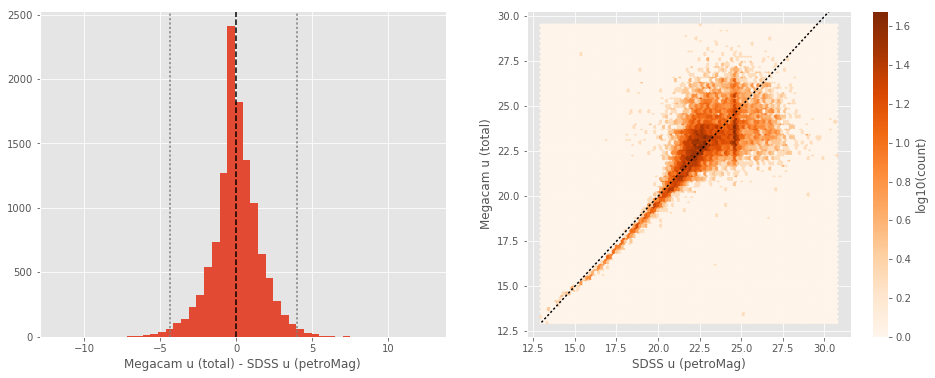

KIDS u (aperture) - SDSS u (fiberMag):
- Median: 0.10
- Median Absolute Deviation: 0.43
- 1% percentile: -1.597728576660156
- 99% percentile: 3.084534339904783


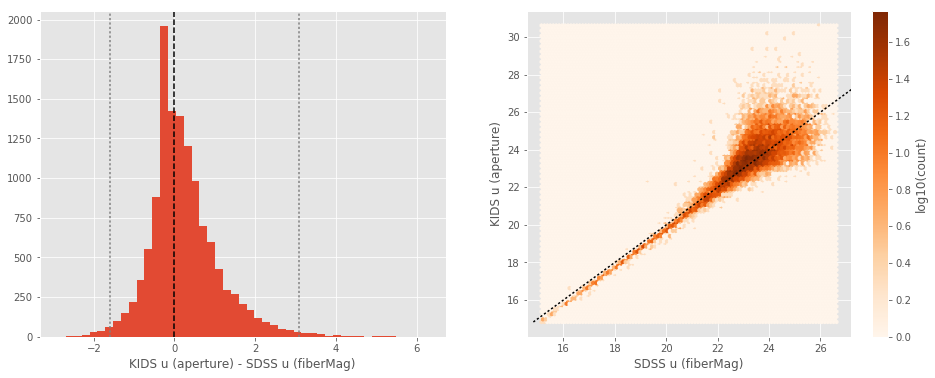

KIDS u (total) - SDSS u (petroMag):
- Median: 0.23
- Median Absolute Deviation: 0.76
- 1% percentile: -4.194290618896484
- 99% percentile: 4.597708740234376


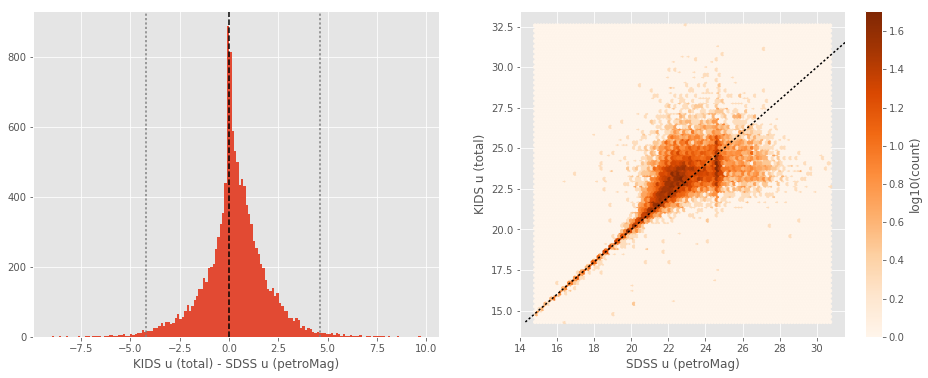

Megacam g (aperture) - SDSS g (fiberMag):
- Median: -0.35
- Median Absolute Deviation: 0.11
- 1% percentile: -1.1430648040771485
- 99% percentile: 0.5928711700439458


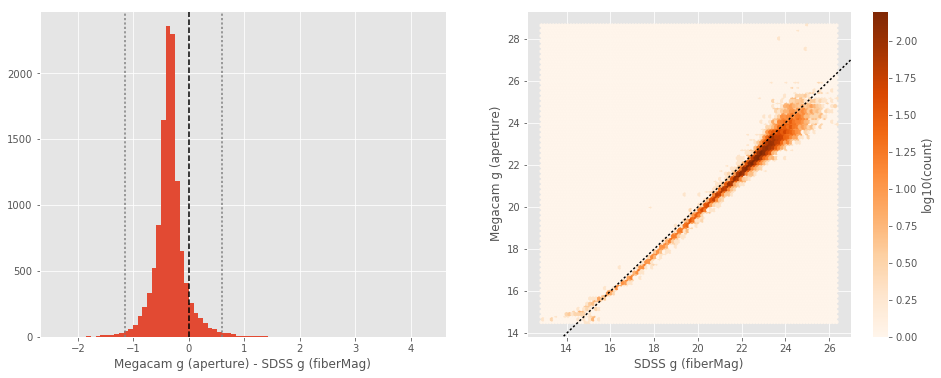

Megacam g (total) - SDSS g (petroMag):
- Median: -0.16
- Median Absolute Deviation: 0.22
- 1% percentile: -3.6148287582397463
- 99% percentile: 1.3122706222534195


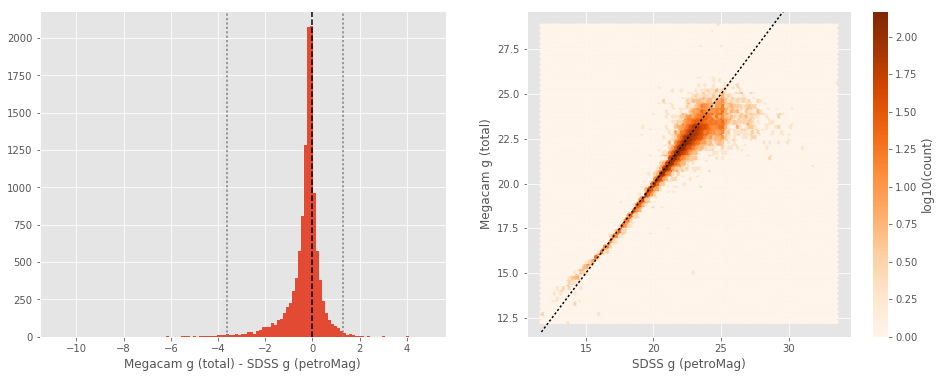

DECam g (aperture) - SDSS g (fiberMag):
- Median: -0.47
- Median Absolute Deviation: 0.15
- 1% percentile: -1.3167925262451172
- 99% percentile: 1.1856491088867194


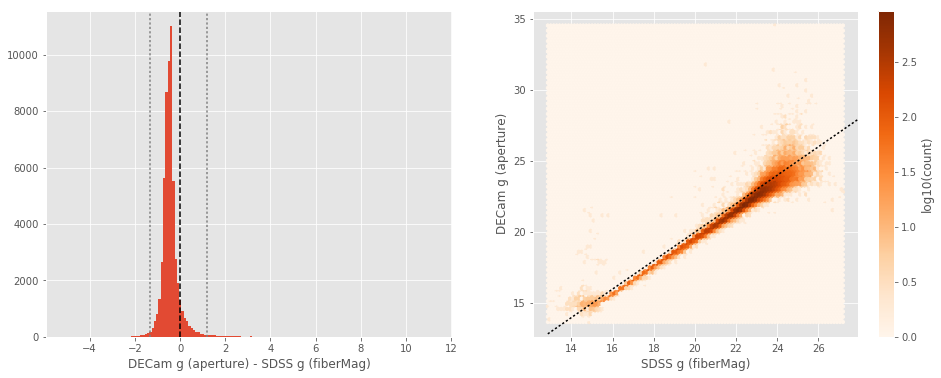

DECam g (total) - SDSS g (petroMag):
- Median: -0.11
- Median Absolute Deviation: 0.23
- 1% percentile: -3.570223388671875
- 99% percentile: 1.755621414184573


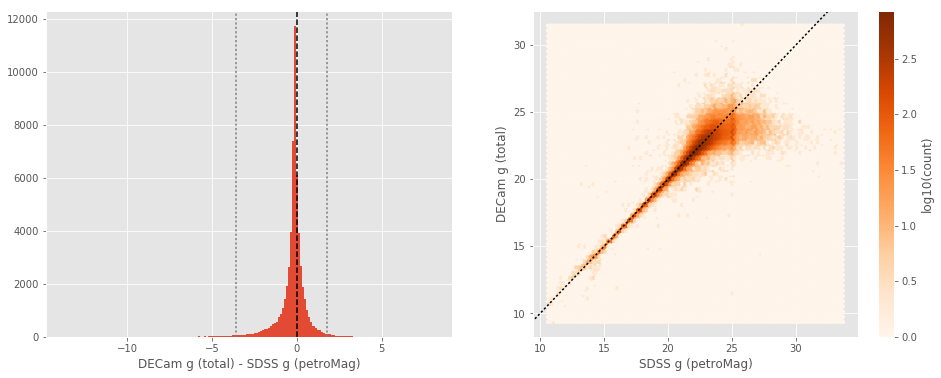

KIDS g (aperture) - SDSS g (fiberMag):
- Median: -0.15
- Median Absolute Deviation: 0.15
- 1% percentile: -0.9207930374145508
- 99% percentile: 0.9936396789550703


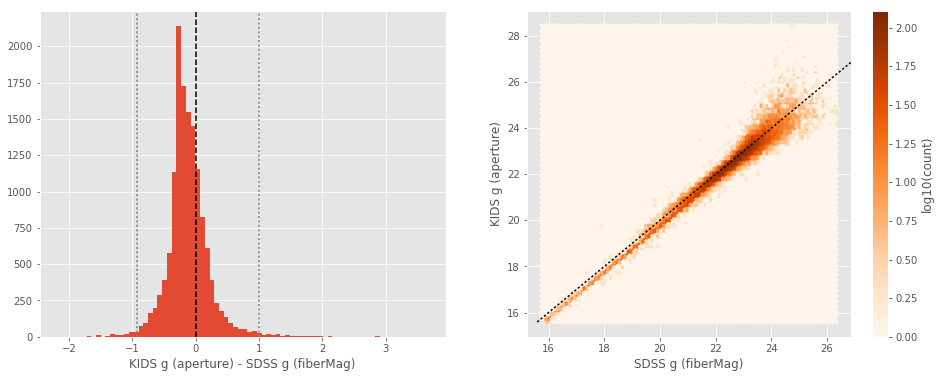

KIDS g (total) - SDSS g (petroMag):
- Median: 0.08
- Median Absolute Deviation: 0.23
- 1% percentile: -3.234930610656738
- 99% percentile: 2.091851272583008


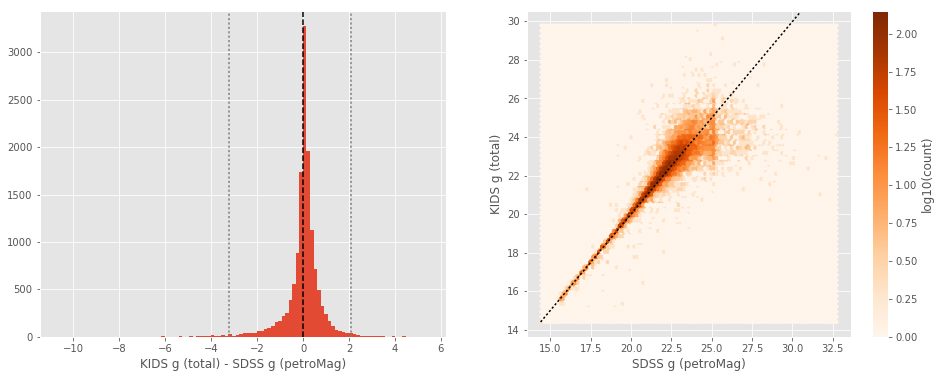

SUPRIME g (aperture) - SDSS g (fiberMag):
- Median: -0.28
- Median Absolute Deviation: 0.17
- 1% percentile: -1.1816984939575195
- 99% percentile: 4.6542678451538


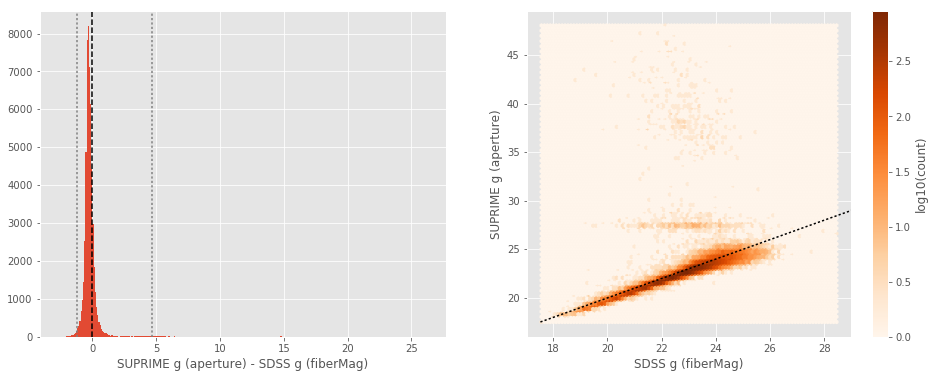

SUPRIME g (total) - SDSS g (petroMag):
- Median: -0.08
- Median Absolute Deviation: 0.27
- 1% percentile: -3.6394704818725585
- 99% percentile: 4.310194206237822


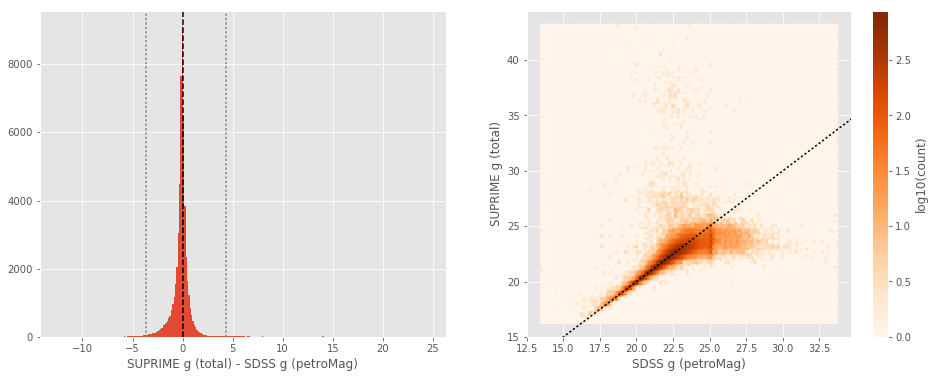

GPC1 g (aperture) - SDSS g (fiberMag):
- Median: -0.51
- Median Absolute Deviation: 0.26
- 1% percentile: -2.4366831970214844
- 99% percentile: 1.9779932022094666


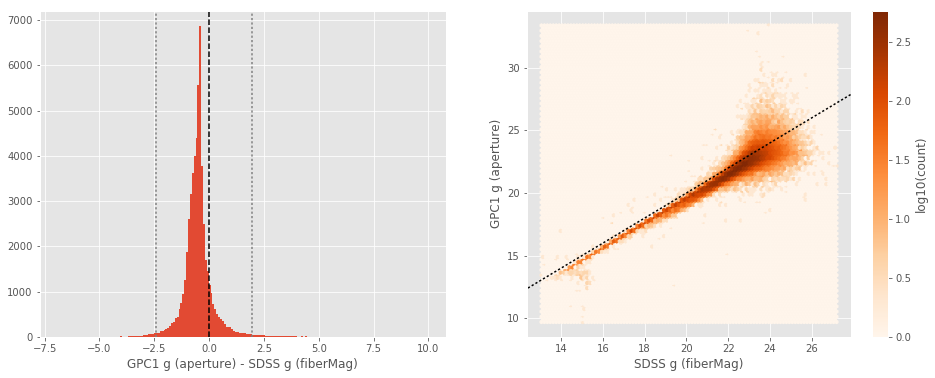

GPC1 g (total) - SDSS g (petroMag):
- Median: -0.09
- Median Absolute Deviation: 0.28
- 1% percentile: -4.29937391281128
- 99% percentile: 1.905803394317626


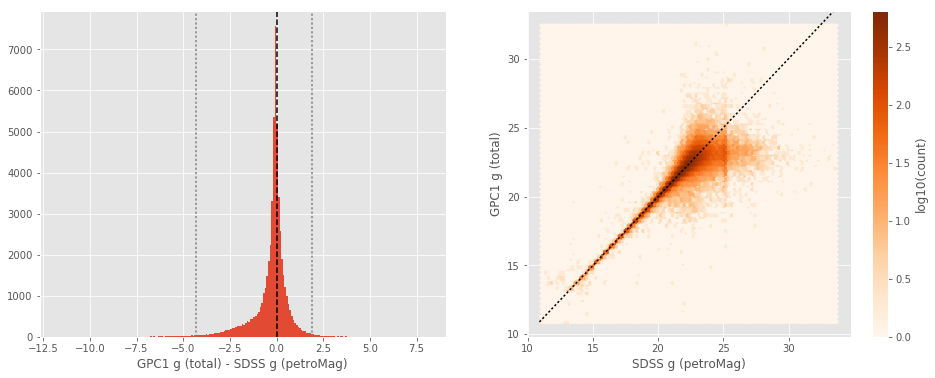

Megacam r (aperture) - SDSS r (fiberMag):
- Median: -0.29
- Median Absolute Deviation: 0.07
- 1% percentile: -0.9997333526611327
- 99% percentile: 0.35298034667968753


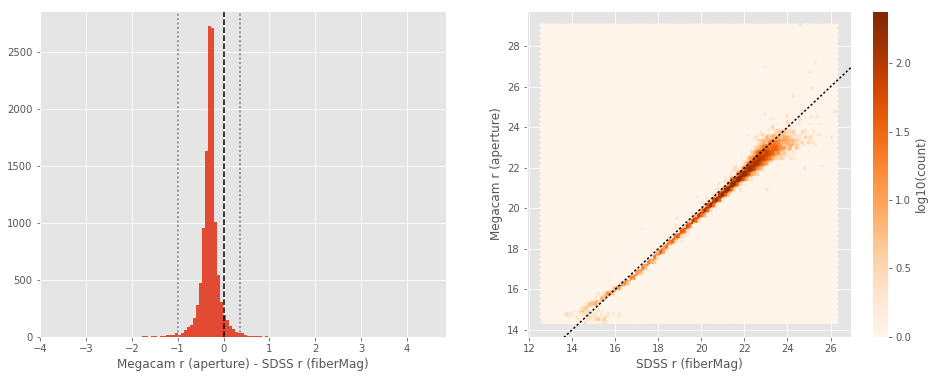

Megacam r (total) - SDSS r (petroMag):
- Median: -0.06
- Median Absolute Deviation: 0.14
- 1% percentile: -3.0153173446655273
- 99% percentile: 1.0062030029296885


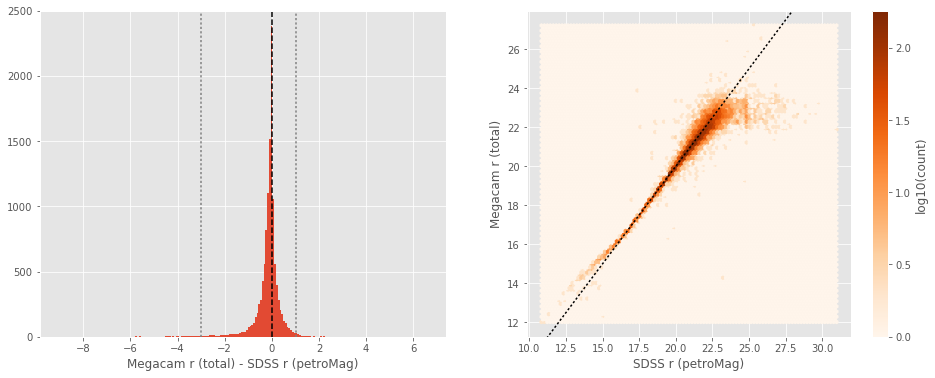

DECam r (aperture) - SDSS r (fiberMag):
- Median: -0.55
- Median Absolute Deviation: 0.12
- 1% percentile: -1.1997455024719237
- 99% percentile: 0.4048216056823746


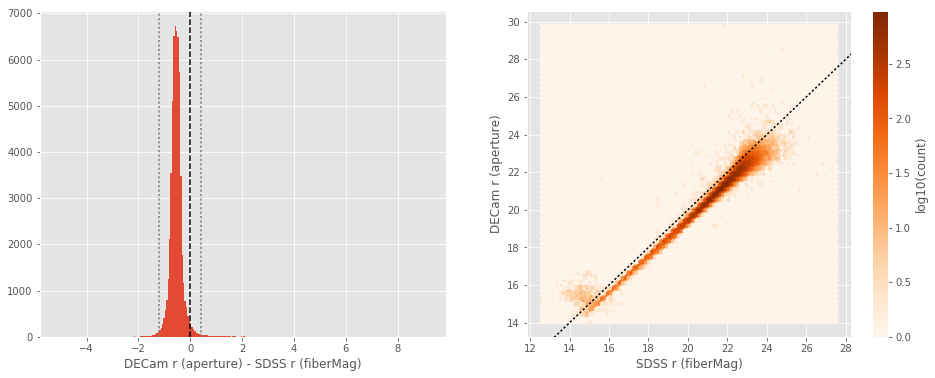

DECam r (total) - SDSS r (petroMag):
- Median: -0.16
- Median Absolute Deviation: 0.15
- 1% percentile: -3.0106480789184573
- 99% percentile: 0.9799940490722654


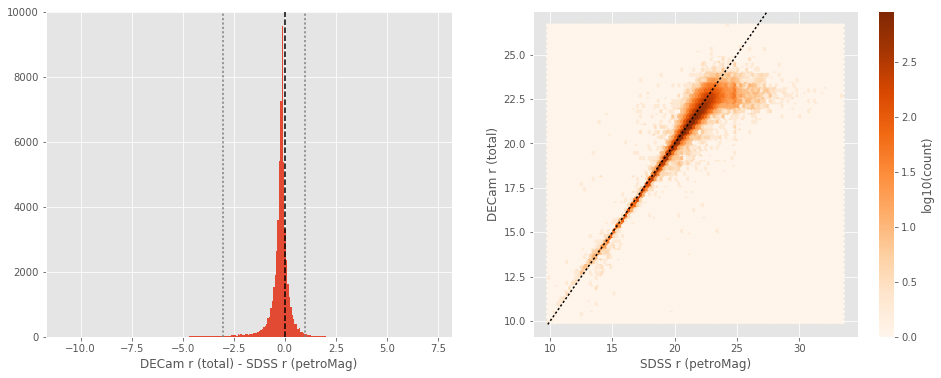

KIDS r (aperture) - SDSS r (fiberMag):
- Median: -0.25
- Median Absolute Deviation: 0.12
- 1% percentile: -0.9678285980224609
- 99% percentile: 0.38065771102905005


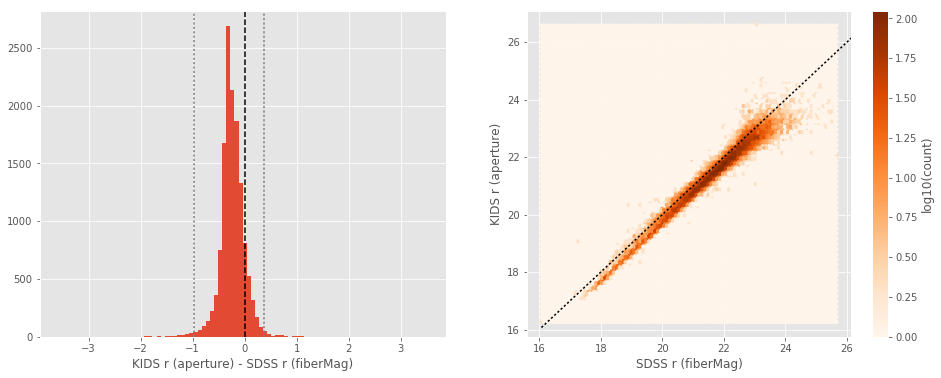

KIDS r (total) - SDSS r (petroMag):
- Median: -0.01
- Median Absolute Deviation: 0.15
- 1% percentile: -2.9153534698486325
- 99% percentile: 1.2088365554809566


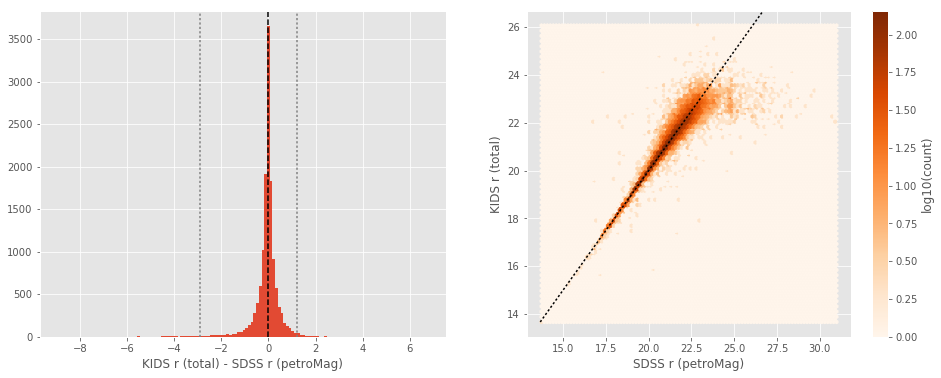

SUPRIME r (aperture) - SDSS r (fiberMag):
- Median: -0.27
- Median Absolute Deviation: 0.13
- 1% percentile: -0.9376730728149414
- 99% percentile: 19.31510007858273


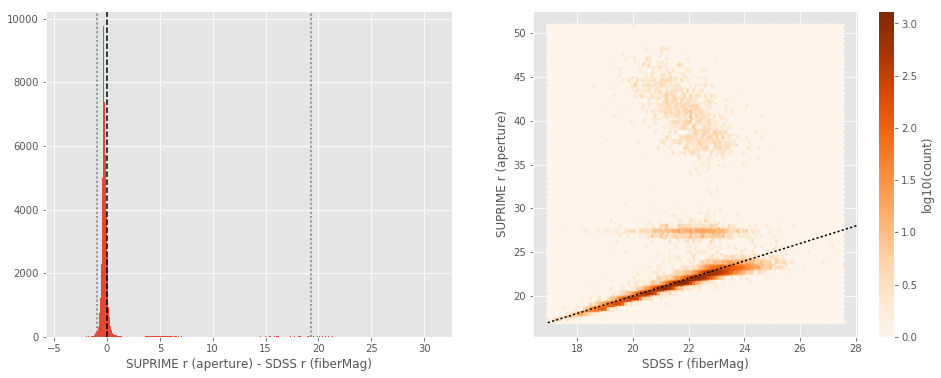

SUPRIME r (total) - SDSS r (petroMag):
- Median: -0.10
- Median Absolute Deviation: 0.18
- 1% percentile: -2.8906237030029294
- 99% percentile: 14.384326629638673


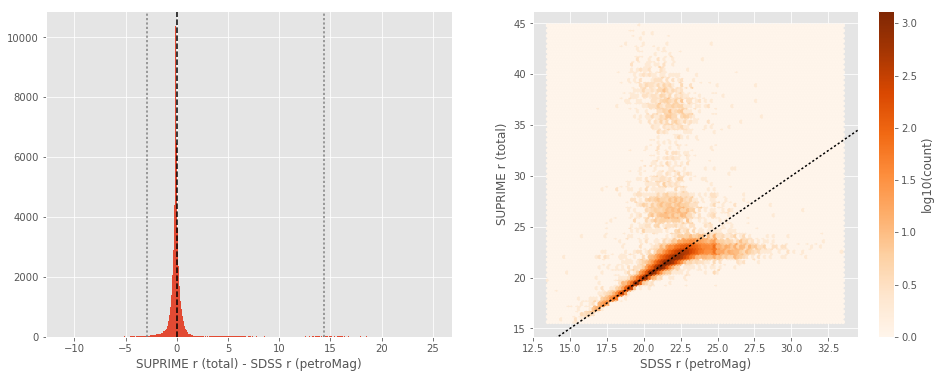

GPC1 r (aperture) - SDSS r (fiberMag):
- Median: -0.40
- Median Absolute Deviation: 0.16
- 1% percentile: -1.4502239227294922
- 99% percentile: 0.918971061706543


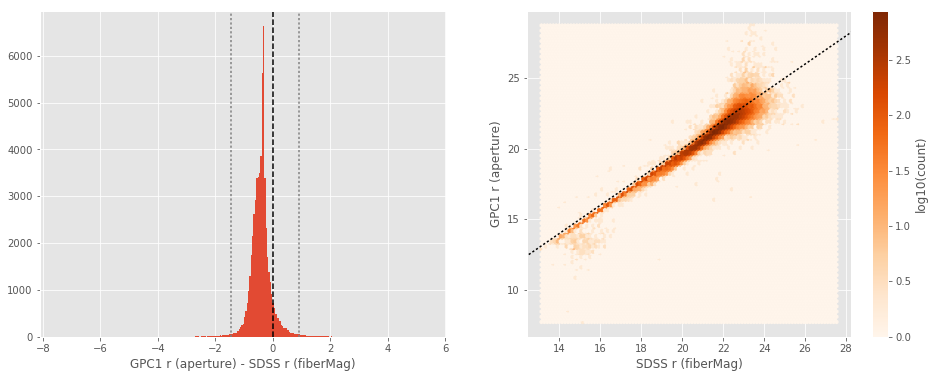

GPC1 r (total) - SDSS r (petroMag):
- Median: 0.03
- Median Absolute Deviation: 0.15
- 1% percentile: -2.8935000038146974
- 99% percentile: 1.3557196998596144


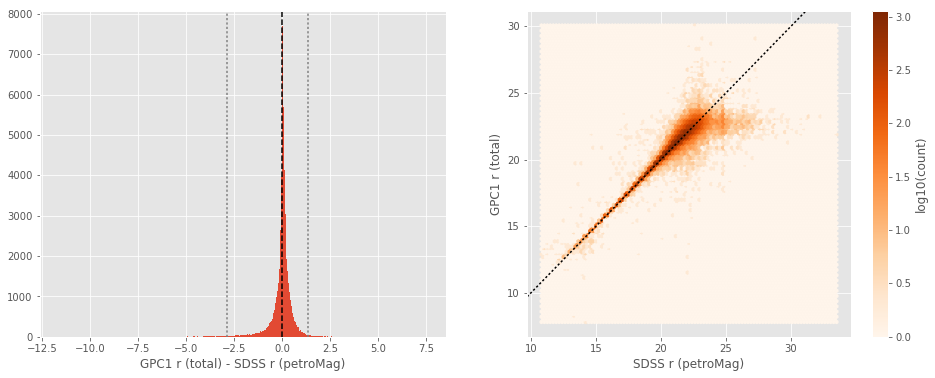

Megacam i (aperture) - SDSS i (fiberMag):
- Median: -0.30
- Median Absolute Deviation: 0.08
- 1% percentile: -0.9130830001831055
- 99% percentile: 0.4375060462951687


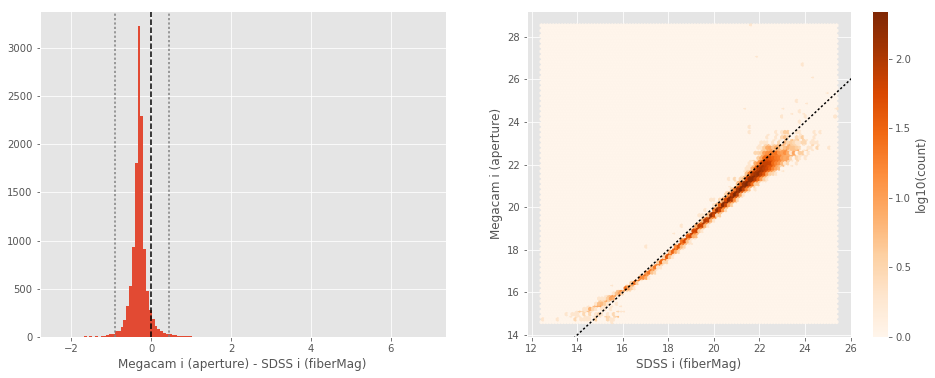

Megacam i (total) - SDSS i (petroMag):
- Median: -0.07
- Median Absolute Deviation: 0.15
- 1% percentile: -3.27773380279541
- 99% percentile: 1.0300380706787147


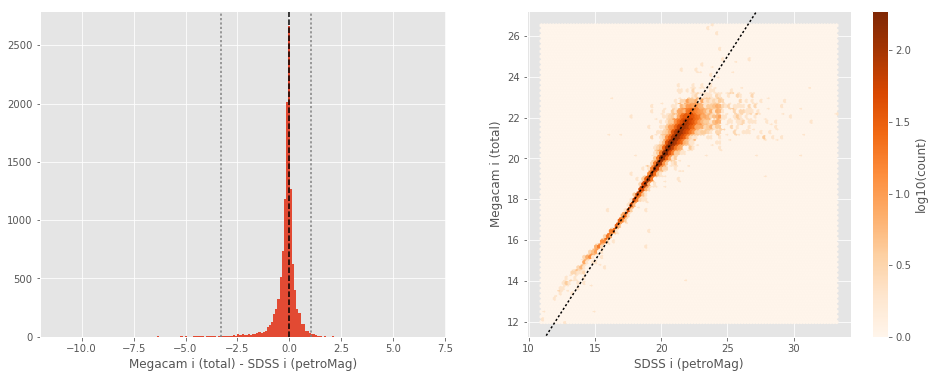

KIDS i (aperture) - SDSS i (fiberMag):
- Median: -0.23
- Median Absolute Deviation: 0.12
- 1% percentile: -0.868525390625
- 99% percentile: 0.4777779388427732


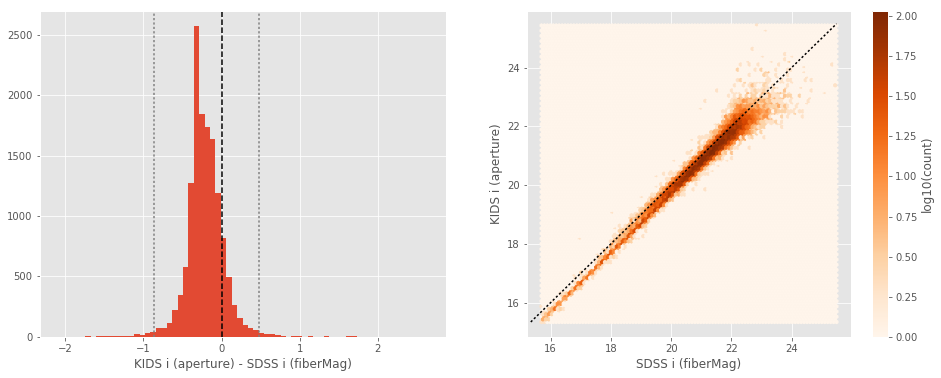

KIDS i (total) - SDSS i (petroMag):
- Median: 0.03
- Median Absolute Deviation: 0.16
- 1% percentile: -3.2415502166748045
- 99% percentile: 1.3450832366943337


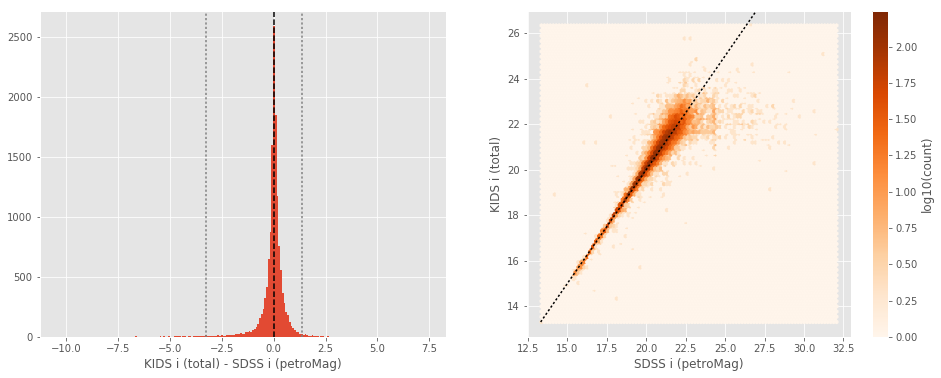

SUPRIME i (aperture) - SDSS i (fiberMag):
- Median: -0.30
- Median Absolute Deviation: 0.13
- 1% percentile: -0.9517079925537109
- 99% percentile: 0.5569943237304685


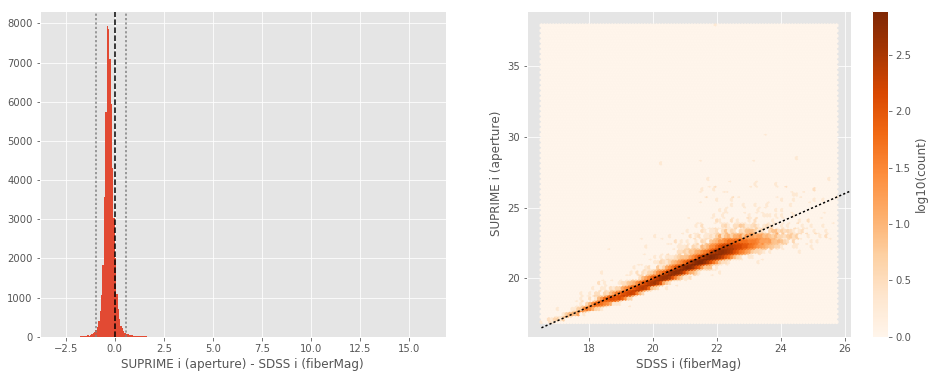

SUPRIME i (total) - SDSS i (petroMag):
- Median: -0.11
- Median Absolute Deviation: 0.18
- 1% percentile: -3.5039387512207028
- 99% percentile: 1.1432917404174916


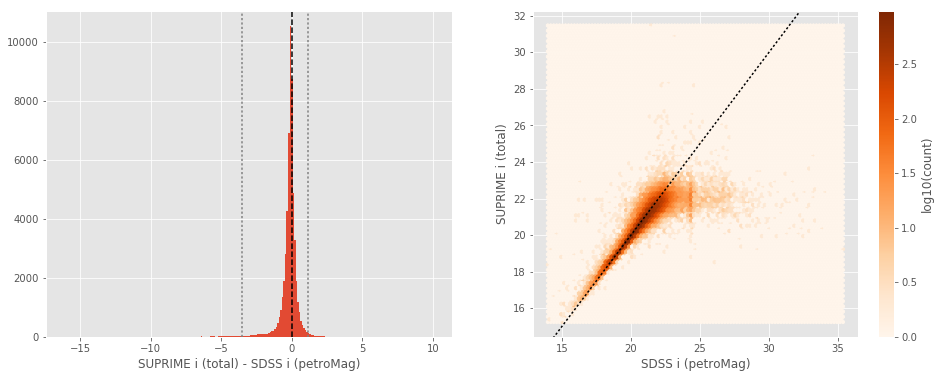

GPC1 i (aperture) - SDSS i (fiberMag):
- Median: -0.40
- Median Absolute Deviation: 0.13
- 1% percentile: -1.1375551223754883
- 99% percentile: 0.5163507461547852


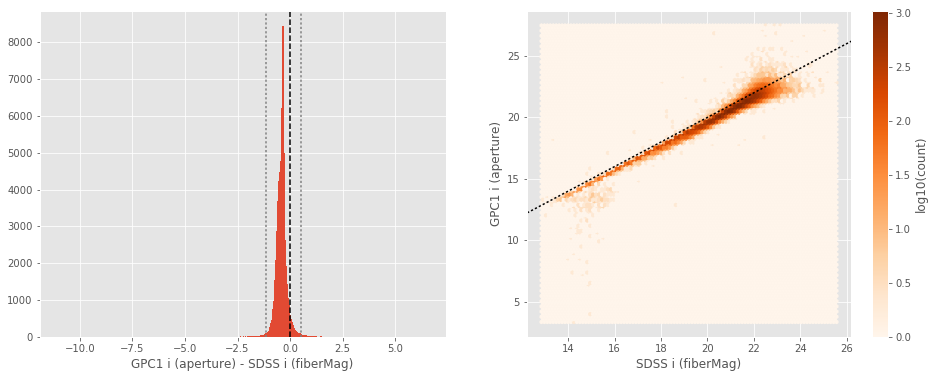

GPC1 i (total) - SDSS i (petroMag):
- Median: 0.05
- Median Absolute Deviation: 0.14
- 1% percentile: -3.095174293518067
- 99% percentile: 1.112330322265624


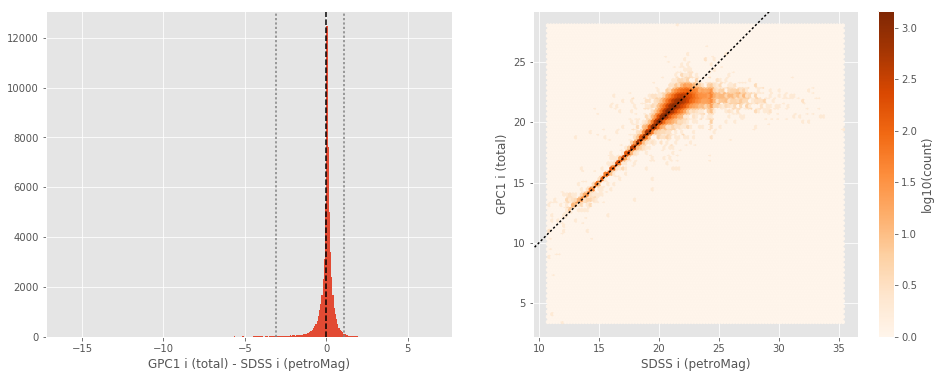

Megacam z (aperture) - SDSS z (fiberMag):
- Median: -0.17
- Median Absolute Deviation: 0.16
- 1% percentile: -1.4817494392395019
- 99% percentile: 0.9686054229736301


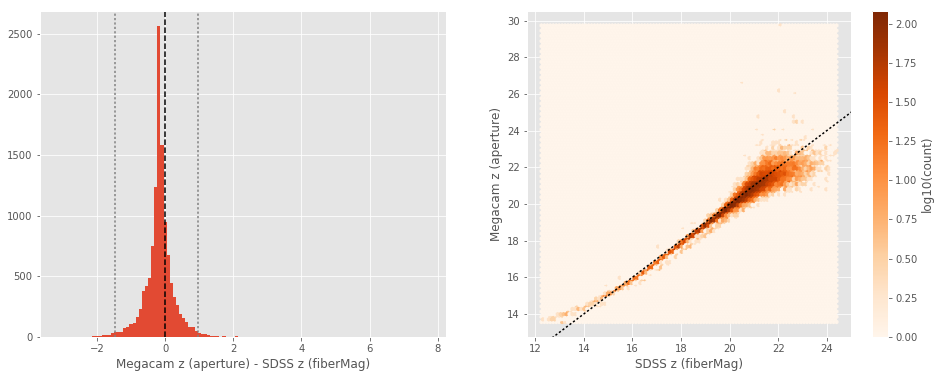

Megacam z (total) - SDSS z (petroMag):
- Median: 0.02
- Median Absolute Deviation: 0.36
- 1% percentile: -4.5977295303344725
- 99% percentile: 1.824040069580078


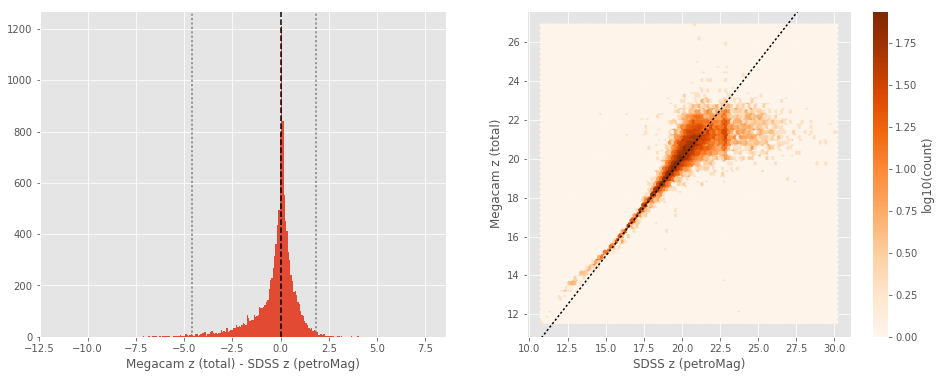

No sources have both SDSS z (fiberMag) and DECam z (aperture) values.
DECam z (total) - SDSS z (petroMag):
- Median: -0.12
- Median Absolute Deviation: 0.32
- 1% percentile: -4.39703239440918
- 99% percentile: 1.7188212585449198


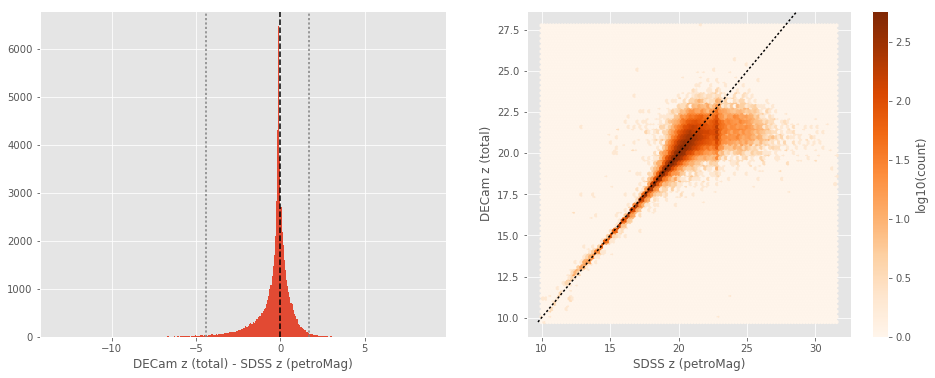

SUPRIME z (aperture) - SDSS z (fiberMag):
- Median: -0.20
- Median Absolute Deviation: 0.19
- 1% percentile: -1.4075223922729494
- 99% percentile: 5.631384277343743


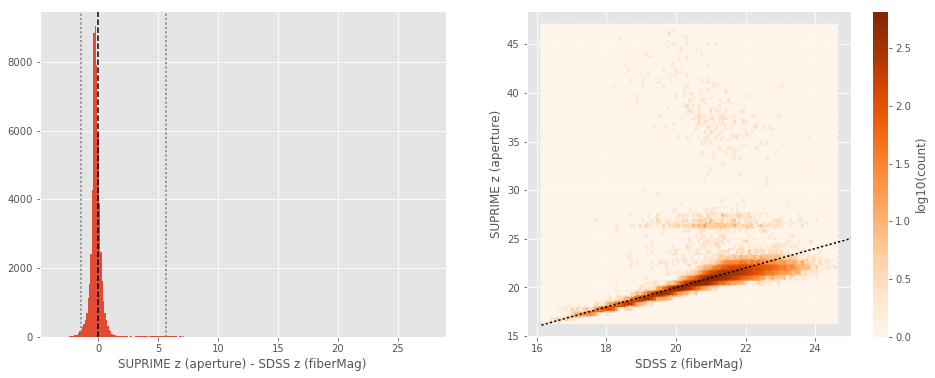

SUPRIME z (total) - SDSS z (petroMag):
- Median: -0.06
- Median Absolute Deviation: 0.38
- 1% percentile: -4.427087116241455
- 99% percentile: 5.343105926513672


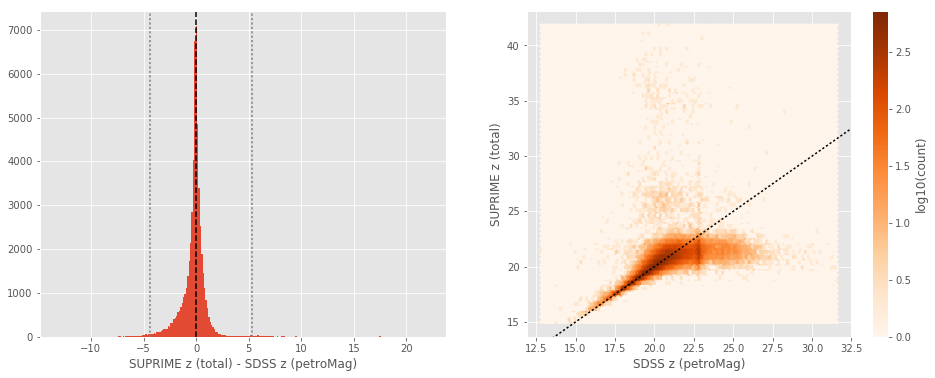

GPC1 z (aperture) - SDSS z (fiberMag):
- Median: -0.31
- Median Absolute Deviation: 0.19
- 1% percentile: -1.5797478485107423
- 99% percentile: 1.140282135009764


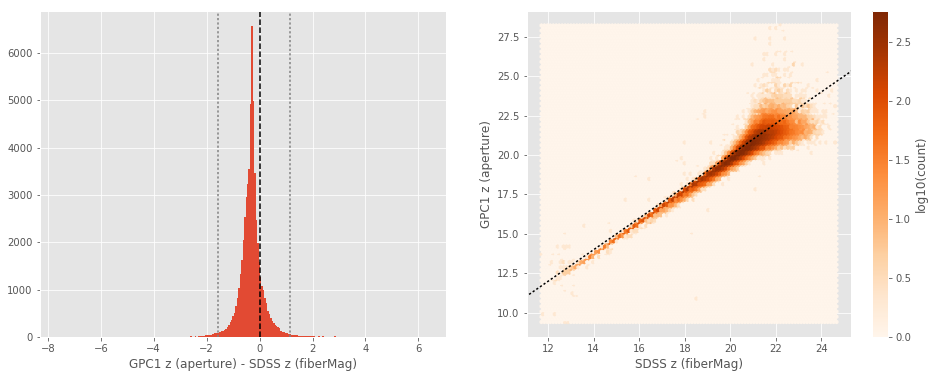

GPC1 z (total) - SDSS z (petroMag):
- Median: 0.10
- Median Absolute Deviation: 0.32
- 1% percentile: -4.19742603302002
- 99% percentile: 1.8786336898803697


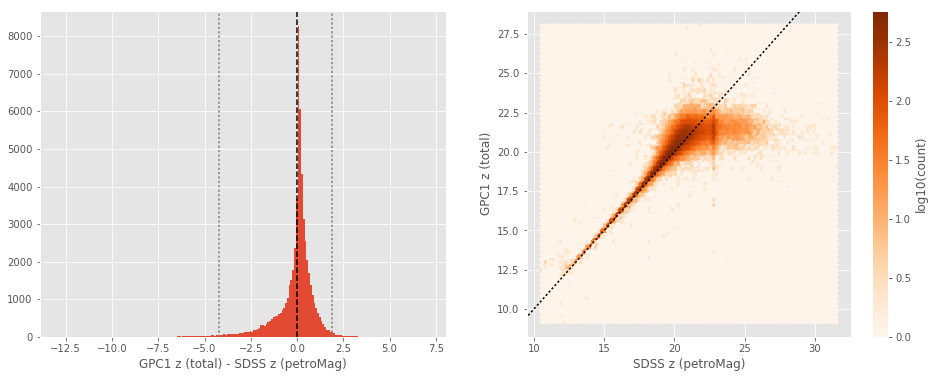

In [13]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands]:
    for band in band_of_a_kind:
        
        sdss_mag_ap = sdss["fiberMag_{}".format(band[-1])]
        master_cat_mag_ap = master_catalogue["m_ap_{}".format(band.replace(" ", "_").lower())][ml_sdss_idx]
    
        nb_compare_mags(sdss_mag_ap, master_cat_mag_ap,
                        labels=("SDSS {} (fiberMag)".format(band[-1]), "{} (aperture)".format(band)))
    
        sdss_mag_tot = sdss["petroMag_{}".format(band[-1])]
        master_cat_mag_tot = master_catalogue["m_{}".format(band.replace(" ", "_").lower())][ml_sdss_idx]
        
        nb_compare_mags(sdss_mag_tot, master_cat_mag_tot,
                        labels=("SDSS {} (petroMag)".format(band[-1]), "{} (total)".format(band)))

### III.b - Comparing J and K bands to 2MASS

The catalogue is cross-matched to 2MASS-PSC withing 0.2 arcsecond. We compare the UKIDSS total J and K magnitudes to those from 2MASS.

The 2MASS magnitudes are “*Vega-like*” and we have to convert them to AB magnitudes using the zero points provided on [this page](http://www.ipac.caltech.edu/2mass/releases/allsky/doc/sec6_4a.html):

| Band | Fν - 0 mag (Jy) |
|------|-----------------|
| J    | 1594            |
| H    | 1024            |
| Ks   | 666.7           |

In addition, UKIDSS uses a K band whereas 2MASS uses a Ks (“short”) band, [this page](http://www.ipac.caltech.edu/2mass/releases/allsky/doc/sec6_4b.html) give a correction to convert the K band in a Ks band with the formula:

$$K_{s(2MASS)} = K_{UKIRT} + 0.003 + 0.004 * (J−K)_{UKIRT}$$

In [14]:
# The AB zero point is 3631 Jy
j_2mass_to_ab = 2.5 * np.log10(3631/1595)
k_2mass_to_ab = 2.5 * np.log10(3631/666.7)

In [15]:
twomass = Table.read("../../dmu0/dmu0_2MASS-point-sources/data/2MASS-PSC_COSMOS.fits")
twomass_coords = SkyCoord(twomass['raj2000'], twomass['dej2000'])

idx, d2d, _ = twomass_coords.match_to_catalog_sky(master_catalogue_coords)
mask = (d2d < 0.2 * u.arcsec)

twomass = twomass[mask]
ml_twomass_idx = idx[mask]

UKIDSS J (total) - 2MASS J:
- Median: 0.06
- Median Absolute Deviation: 0.06
- 1% percentile: -0.7163926483060652
- 99% percentile: 2.9992231956575597


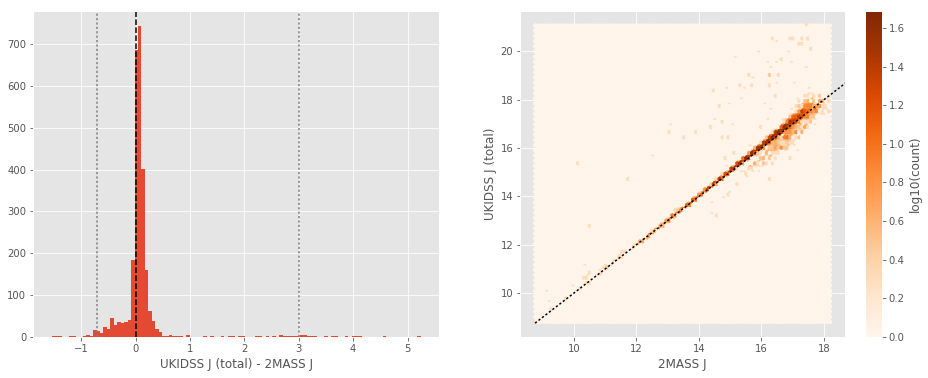

In [16]:
nb_compare_mags(twomass['jmag'] + j_2mass_to_ab, master_catalogue['m_ukidss_j'][ml_twomass_idx],
                labels=("2MASS J", "UKIDSS J (total)"))

UKIDSS Ks-like (total) - 2MASS Ks:
- Median: 0.11
- Median Absolute Deviation: 0.08
- 1% percentile: -0.7419853468950799
- 99% percentile: 0.9120592234174177


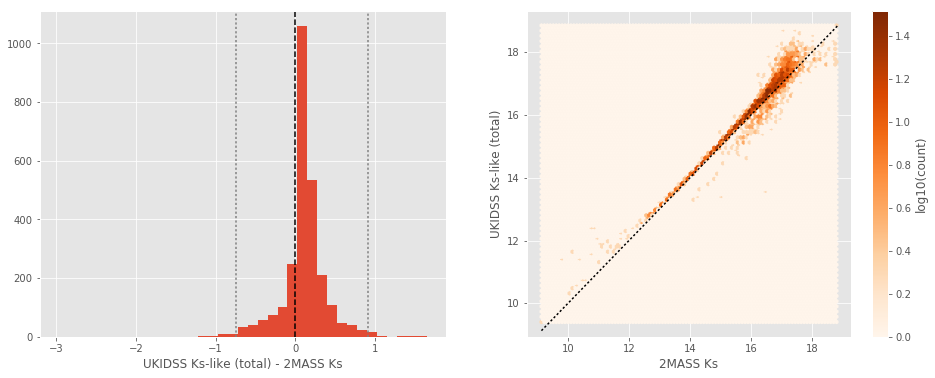

In [17]:
ukidss_ks_like = master_catalogue['m_ukidss_k'] + 0.003 + 0.004 * (
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'])
nb_compare_mags(twomass['kmag'] + k_2mass_to_ab, ukidss_ks_like[ml_twomass_idx],
                labels=("2MASS Ks", "UKIDSS Ks-like (total)"))

VISTA J (total) - 2MASS J:
- Median: -0.01
- Median Absolute Deviation: 0.05
- 1% percentile: -0.749675903799232
- 99% percentile: 1.565876096200768


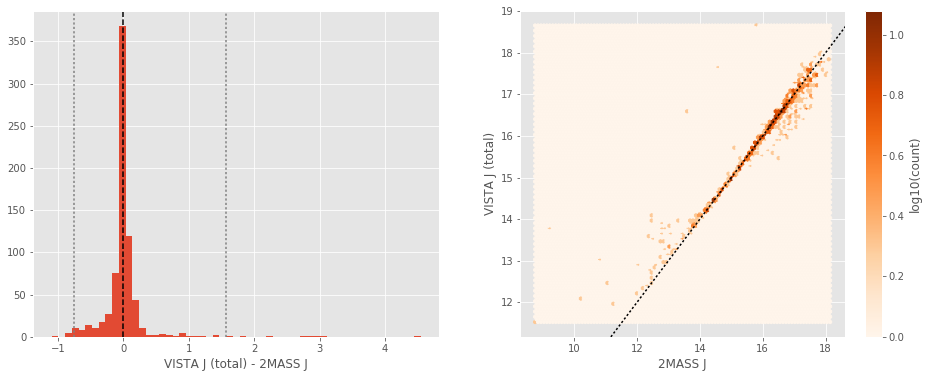

In [18]:
nb_compare_mags(twomass['jmag'] + j_2mass_to_ab, master_catalogue['m_wirds_j'][ml_twomass_idx],
                labels=("2MASS J", "VISTA J (total)"))

VISTA Ks (total) - 2MASS Ks:
- Median: -0.00
- Median Absolute Deviation: 0.09
- 1% percentile: -1.2388374844683208
- 99% percentile: 0.7511585155316783


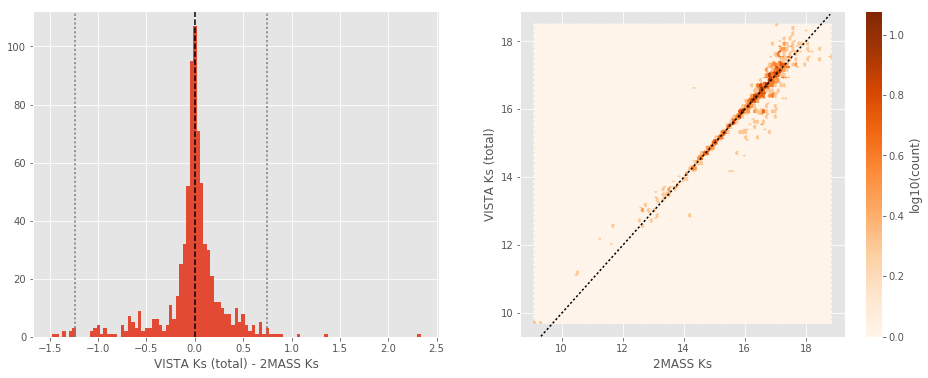

In [19]:
nb_compare_mags(twomass['kmag'] + k_2mass_to_ab, master_catalogue['m_wirds_ks'][ml_twomass_idx],
                labels=("2MASS Ks", "VISTA Ks (total)"))

## IV - Comparing aperture magnitudes to total ones.

Number of source used: 524587 / 2779194 (18.88%)


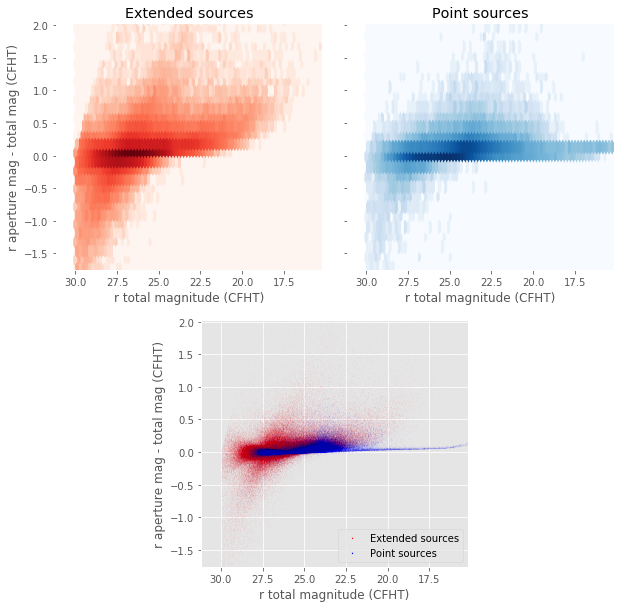

In [20]:
nb_ccplots(
    master_catalogue['m_megacam_r'],
    master_catalogue['m_ap_megacam_r'] - master_catalogue['m_megacam_r'],
    "r total magnitude (CFHT)", "r aperture mag - total mag (CFHT)",
    master_catalogue["stellarity"],
    invert_x=True
)

## V - Color-color and magnitude-color plots

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in subtract
  from ipykernel import kernelapp as app


Number of source used: 24171 / 2779194 (0.87%)


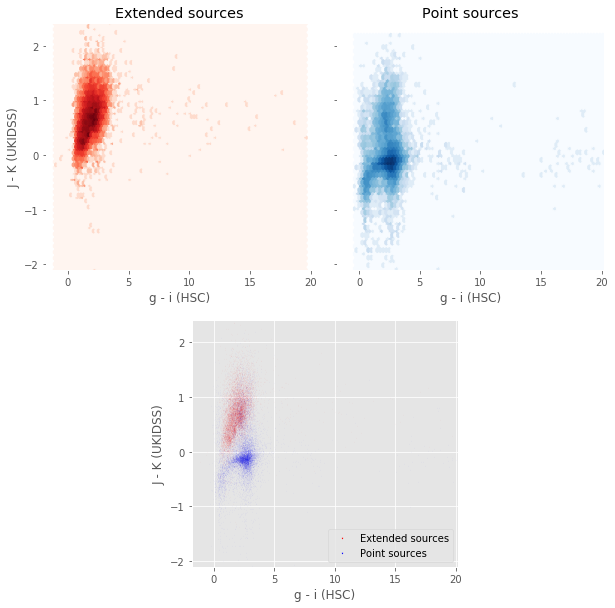

In [21]:
nb_ccplots(
    master_catalogue['m_suprime_g'] - master_catalogue['m_suprime_i'],
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'],
    "g - i (HSC)", "J - K (UKIDSS)",
    master_catalogue["stellarity"]
)

Number of source used: 101176 / 2779194 (3.64%)


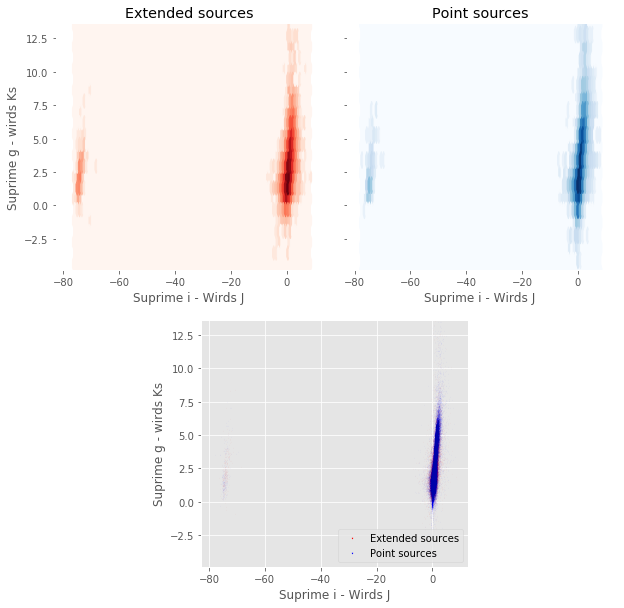

In [22]:
nb_ccplots(
    master_catalogue['m_suprime_i'] - master_catalogue['m_wirds_j'],
    master_catalogue['m_suprime_g'] - master_catalogue['m_wirds_ks'],
    "Suprime i - Wirds J", "Suprime g - wirds Ks",
    master_catalogue["stellarity"]
)

Number of source used: 439840 / 2779194 (15.83%)


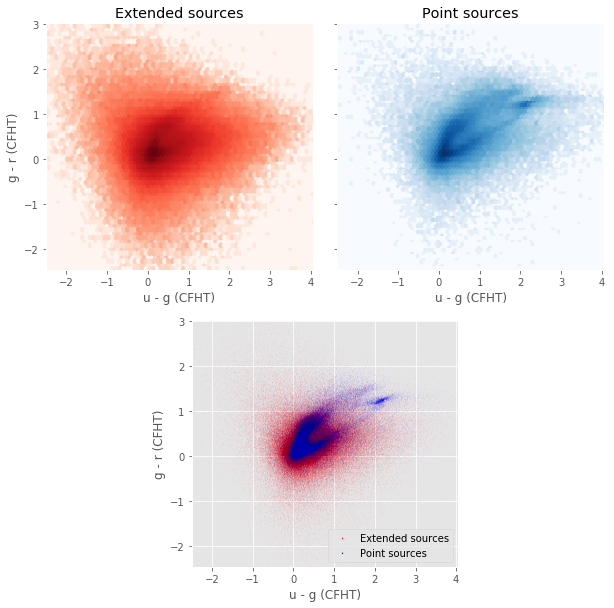

In [23]:
nb_ccplots(
    master_catalogue['m_megacam_u'] - master_catalogue['m_megacam_g'],
    master_catalogue['m_megacam_g'] - master_catalogue['m_megacam_r'],
    "u - g (CFHT)", "g - r (CFHT)",
    master_catalogue["stellarity"]
)

Number of source used: 24173 / 2779194 (0.87%)


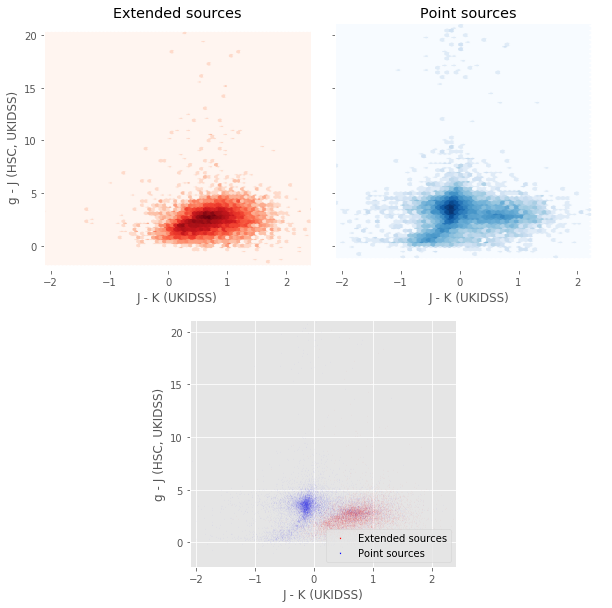

In [24]:
nb_ccplots(
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'],
    master_catalogue['m_suprime_g'] - master_catalogue['m_ukidss_j'],
    "J - K (UKIDSS)", "g - J (HSC, UKIDSS)",
    master_catalogue["stellarity"]
)

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in subtract
  from ipykernel import kernelapp as app


Number of source used: 27723 / 2779194 (1.00%)


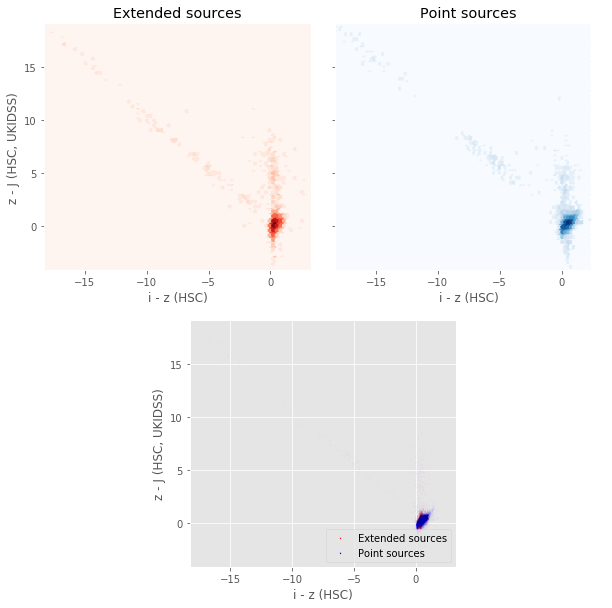

In [25]:
nb_ccplots(
    master_catalogue['m_suprime_i'] - master_catalogue['m_suprime_z'],
    master_catalogue['m_suprime_z'] - master_catalogue['m_ukidss_j'],
    "i - z (HSC)", "z - J (HSC, UKIDSS)",
    master_catalogue["stellarity"]
)